## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "singer_age_decade_10"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 10


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 100


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


Matplotlib is building the font cache; this may take a moment.


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6386
Epoch 11 Validation Loss: 0.6774
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5917
Epoch 21 Validation Loss: 0.6664
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5511
Epoch 31 Validation Loss: 0.6589
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5157
Epoch 41 Validation Loss: 0.6544
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4844
Epoch 51 Validation Loss: 0.6524
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4588
Epoch 61 Validation Loss: 0.6522
Early stopping at epoch 61
Loss history saved to trainings/singer_age_decade_10/loss_history

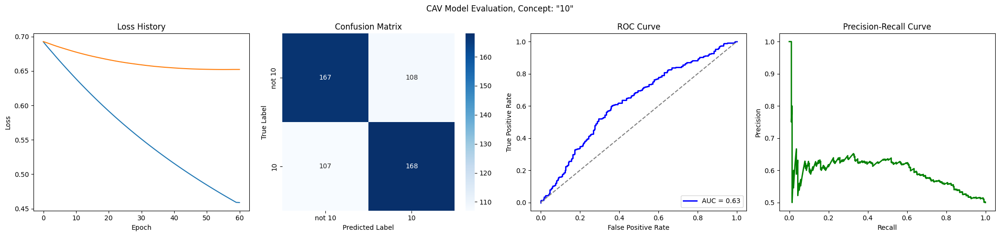

Training run 2/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6728
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5936
Epoch 21 Validation Loss: 0.6635
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5532
Epoch 31 Validation Loss: 0.6583
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5182
Epoch 41 Validation Loss: 0.6555
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4876
Epoch 51 Validation Loss: 0.6546
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/singer_age_decade_10/loss_history.json


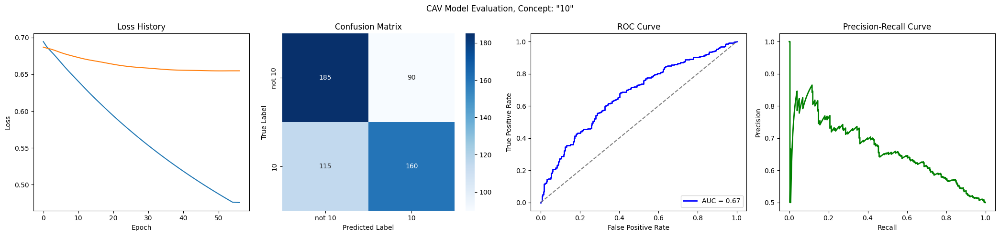

Training run 3/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6982
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6444
Epoch 11 Validation Loss: 0.6836
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6034
Epoch 21 Validation Loss: 0.6697
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5677
Epoch 31 Validation Loss: 0.6564
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5360
Epoch 41 Validation Loss: 0.6451
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5076
Epoch 51 Validation Loss: 0.6365
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4818
Epoch 61 Validation Loss: 0.6301
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

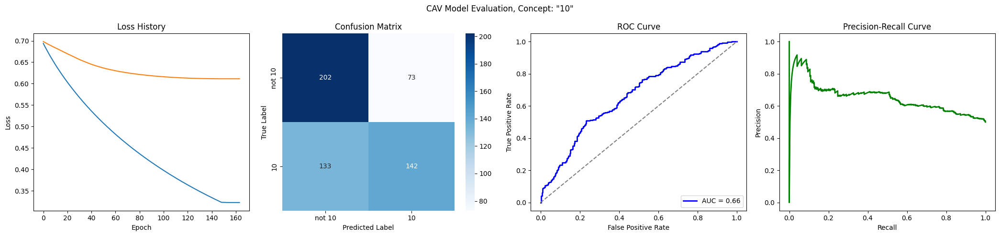

Training run 4/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6325
Epoch 11 Validation Loss: 0.6698
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5821
Epoch 21 Validation Loss: 0.6537
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5401
Epoch 31 Validation Loss: 0.6415
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5047
Epoch 41 Validation Loss: 0.6320
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4741
Epoch 51 Validation Loss: 0.6245
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4473
Epoch 61 Validation Loss: 0.6190
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

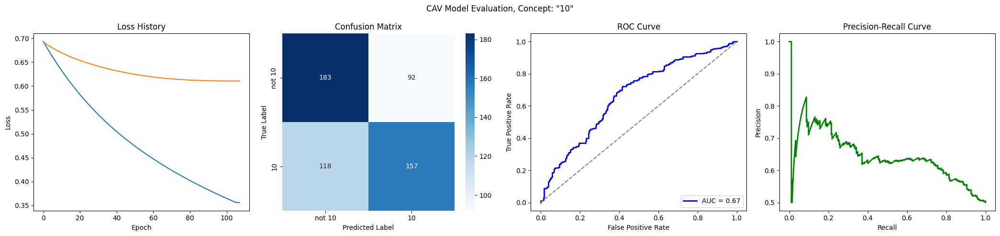

Training run 5/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6993
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5988
Epoch 21 Validation Loss: 0.6618
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5589
Epoch 31 Validation Loss: 0.6500
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5241
Epoch 41 Validation Loss: 0.6417
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4932
Epoch 51 Validation Loss: 0.6357
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4656
Epoch 61 Validation Loss: 0.6320
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

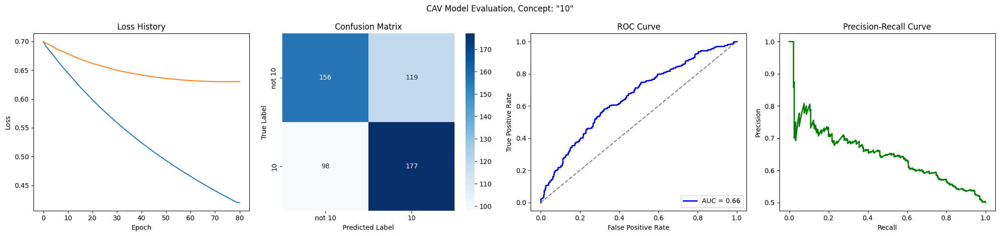

Training run 6/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6430
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5976
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5628
Epoch 31 Validation Loss: 0.6800
Early stopping at epoch 31
Loss history saved to trainings/singer_age_decade_10/loss_history.json


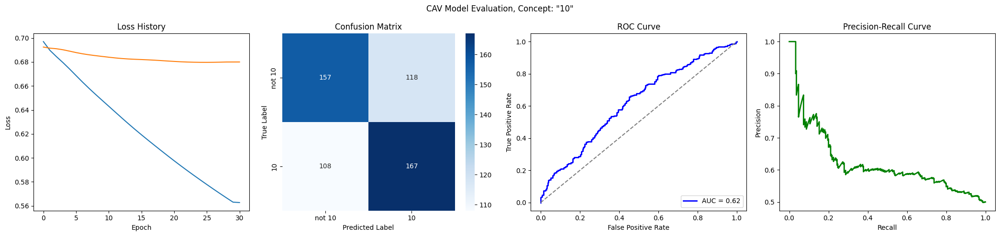

Training run 7/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7010
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6509
Epoch 11 Validation Loss: 0.6817
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6091
Epoch 21 Validation Loss: 0.6763
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5728
Epoch 31 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5581
Epoch 41 Validation Loss: 0.6738
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5579
Epoch 51 Validation Loss: 0.6738
Early stopping at epoch 60
Loss history saved to trainings/singer_age_decade_10/loss_history.json


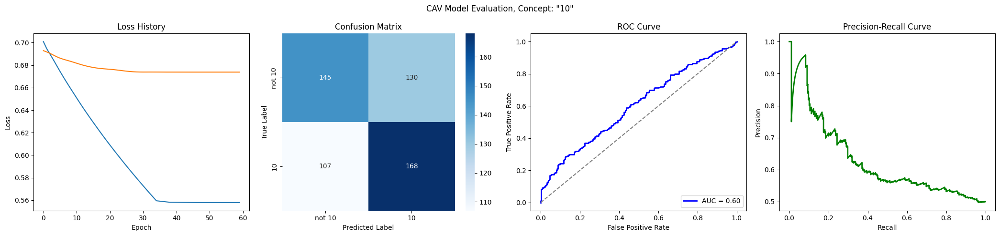

Training run 8/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6543
Epoch 11 Validation Loss: 0.6838
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6175
Epoch 21 Validation Loss: 0.6744
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5844
Epoch 31 Validation Loss: 0.6666
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5544
Epoch 41 Validation Loss: 0.6603
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5271
Epoch 51 Validation Loss: 0.6558
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5022
Epoch 61 Validation Loss: 0.6528
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Los

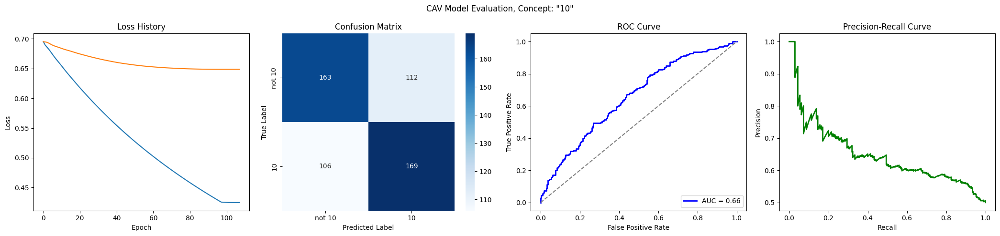

Training run 9/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6394
Epoch 11 Validation Loss: 0.6812
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5945
Epoch 21 Validation Loss: 0.6713
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5563
Epoch 31 Validation Loss: 0.6637
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5233
Epoch 41 Validation Loss: 0.6587
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4943
Epoch 51 Validation Loss: 0.6565
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4707
Epoch 61 Validation Loss: 0.6562
Early stopping at epoch 62
Loss history saved to trainings/singer_age_decade_10/loss_history

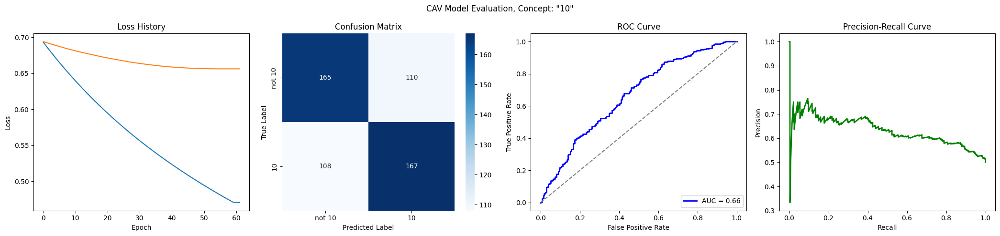

Training run 10/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6442
Epoch 11 Validation Loss: 0.6705
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5977
Epoch 21 Validation Loss: 0.6568
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5580
Epoch 31 Validation Loss: 0.6484
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5237
Epoch 41 Validation Loss: 0.6440
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4938
Epoch 51 Validation Loss: 0.6425
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_10/loss_history.json


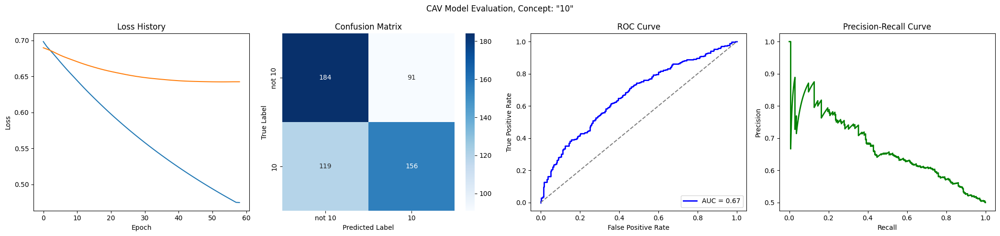

Training run 11/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6475
Epoch 11 Validation Loss: 0.6732
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6076
Epoch 21 Validation Loss: 0.6620
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5715
Epoch 31 Validation Loss: 0.6521
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5393
Epoch 41 Validation Loss: 0.6458
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5106
Epoch 51 Validation Loss: 0.6411
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4848
Epoch 61 Validation Loss: 0.6374
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

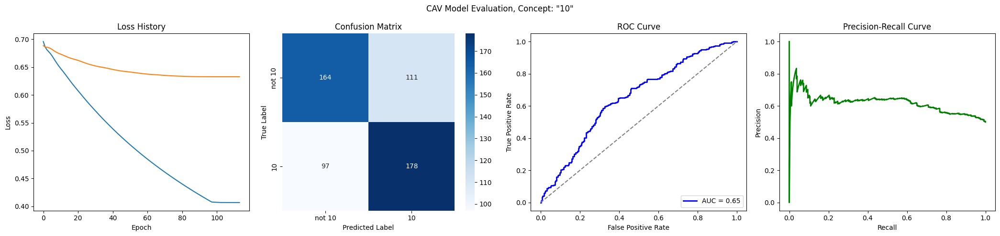

Training run 12/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7004
Epoch 1 Validation Loss: 0.6969
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6407
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5898
Epoch 21 Validation Loss: 0.6645
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5463
Epoch 31 Validation Loss: 0.6521
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5090
Epoch 41 Validation Loss: 0.6430
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4767
Epoch 51 Validation Loss: 0.6372
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4484
Epoch 61 Validation Loss: 0.6336
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

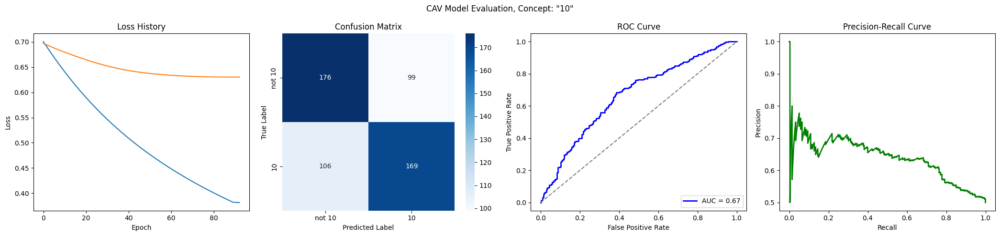

Training run 13/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6851
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6383
Epoch 11 Validation Loss: 0.6573
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5904
Epoch 21 Validation Loss: 0.6361
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5499
Epoch 31 Validation Loss: 0.6195
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5152
Epoch 41 Validation Loss: 0.6066
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4848
Epoch 51 Validation Loss: 0.5968
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4580
Epoch 61 Validation Loss: 0.5895
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

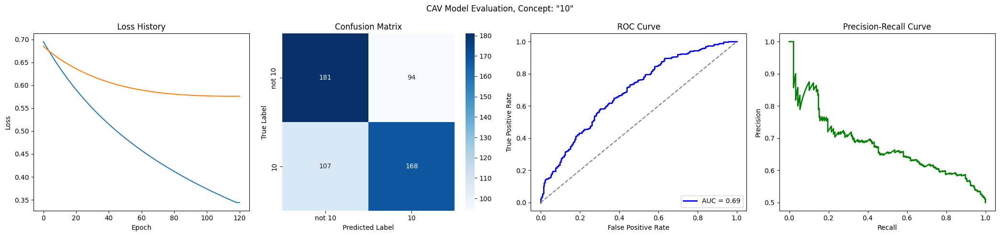

Training run 14/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6394
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5923
Epoch 21 Validation Loss: 0.6793
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/singer_age_decade_10/loss_history.json


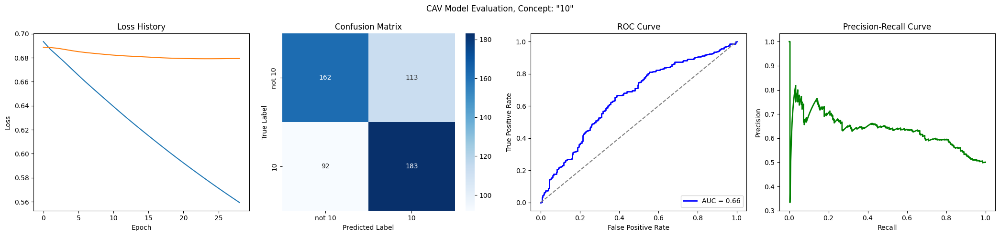

Training run 15/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6861
Epoch 1 Validation Loss: 0.6816
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6332
Epoch 11 Validation Loss: 0.6606
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5919
Epoch 21 Validation Loss: 0.6455
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5584
Epoch 31 Validation Loss: 0.6337
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5300
Epoch 41 Validation Loss: 0.6244
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5048
Epoch 51 Validation Loss: 0.6173
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4822
Epoch 61 Validation Loss: 0.6121
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

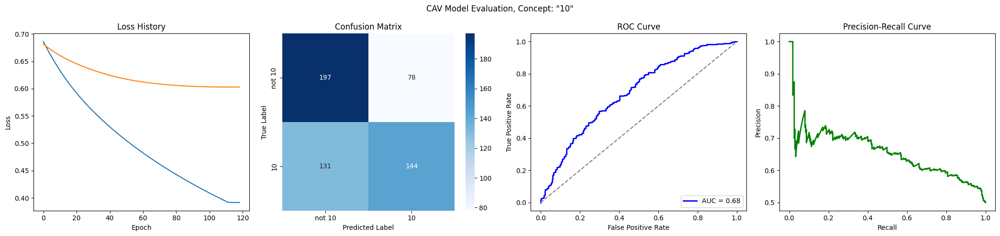

Training run 16/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6954
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6403
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5911
Epoch 21 Validation Loss: 0.6718
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5504
Epoch 31 Validation Loss: 0.6627
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5163
Epoch 41 Validation Loss: 0.6550
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4873
Epoch 51 Validation Loss: 0.6488
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4620
Epoch 61 Validation Loss: 0.6439
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

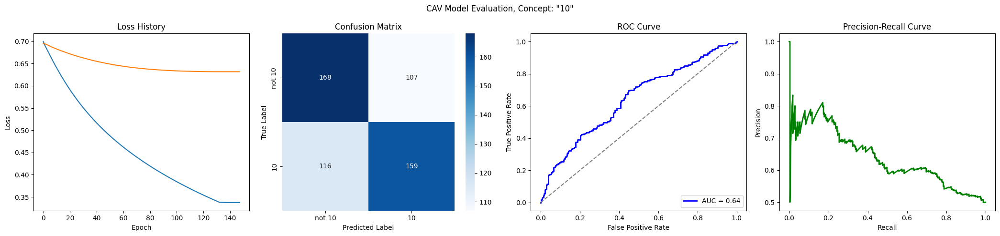

Training run 17/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7033
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6413
Epoch 11 Validation Loss: 0.6857
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5923
Epoch 21 Validation Loss: 0.6850
Early stopping at epoch 22
Loss history saved to trainings/singer_age_decade_10/loss_history.json


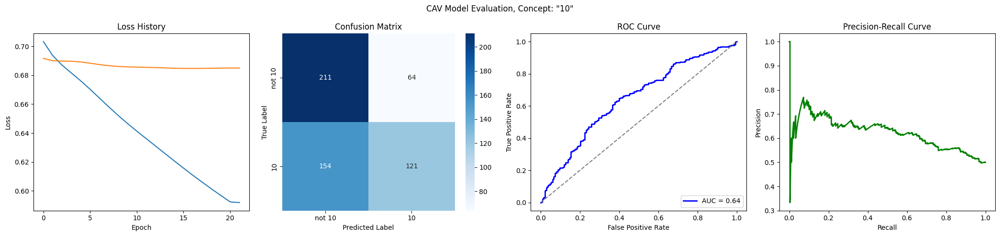

Training run 18/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6846
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6473
Epoch 11 Validation Loss: 0.6769
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6045
Epoch 21 Validation Loss: 0.6694
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5675
Epoch 31 Validation Loss: 0.6620
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5352
Epoch 41 Validation Loss: 0.6553
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5066
Epoch 51 Validation Loss: 0.6501
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4810
Epoch 61 Validation Loss: 0.6467
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

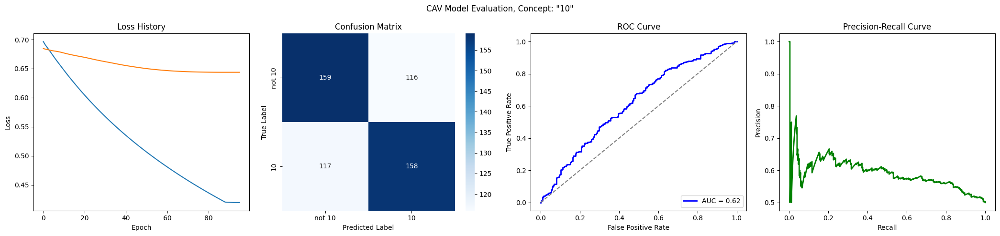

Training run 19/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6348
Epoch 11 Validation Loss: 0.6780
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5855
Epoch 21 Validation Loss: 0.6699
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5444
Epoch 31 Validation Loss: 0.6669
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 40
Loss history saved to trainings/singer_age_decade_10/loss_history.json


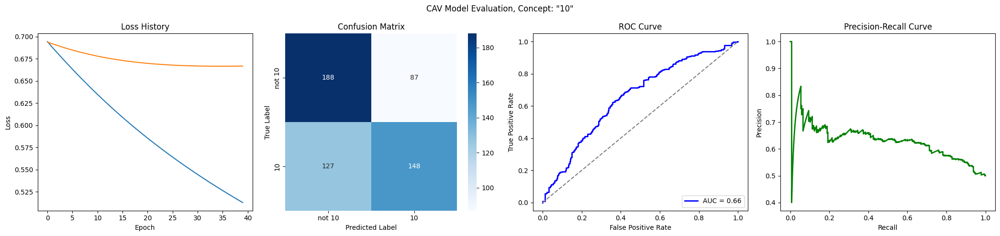

Training run 20/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6414
Epoch 11 Validation Loss: 0.6684
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5943
Epoch 21 Validation Loss: 0.6490
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5553
Epoch 31 Validation Loss: 0.6357
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5224
Epoch 41 Validation Loss: 0.6265
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4942
Epoch 51 Validation Loss: 0.6201
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4693
Epoch 61 Validation Loss: 0.6158
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

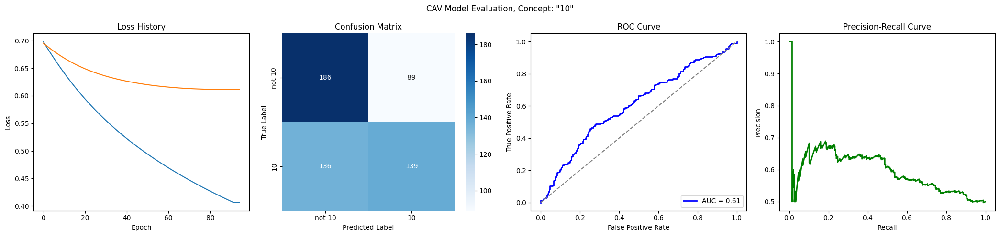

Training run 21/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6885
Epoch 1 Validation Loss: 0.6907
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6383
Epoch 11 Validation Loss: 0.6759
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5965
Epoch 21 Validation Loss: 0.6662
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5614
Epoch 31 Validation Loss: 0.6603
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5315
Epoch 41 Validation Loss: 0.6565
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5055
Epoch 51 Validation Loss: 0.6541
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4824
Epoch 61 Validation Loss: 0.6528
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

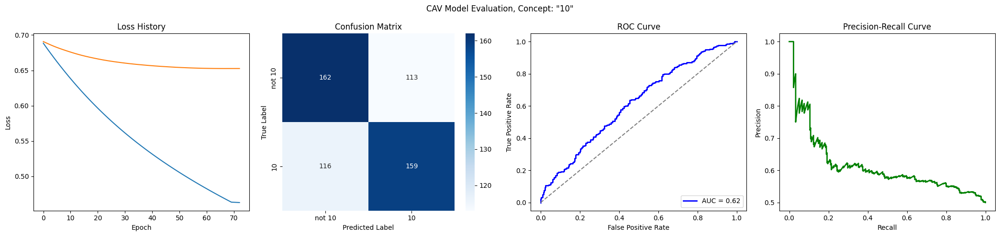

Training run 22/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6473
Epoch 11 Validation Loss: 0.6611
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6066
Epoch 21 Validation Loss: 0.6396
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5712
Epoch 31 Validation Loss: 0.6228
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5400
Epoch 41 Validation Loss: 0.6098
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5123
Epoch 51 Validation Loss: 0.6001
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4875
Epoch 61 Validation Loss: 0.5929
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

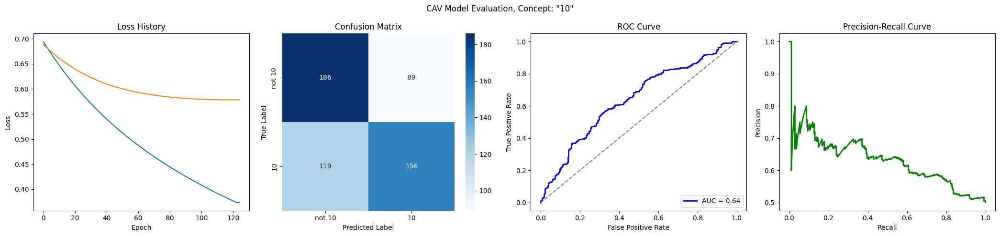

Training run 23/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6858
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6369
Epoch 11 Validation Loss: 0.6632
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5917
Epoch 21 Validation Loss: 0.6450
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5542
Epoch 31 Validation Loss: 0.6307
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5227
Epoch 41 Validation Loss: 0.6197
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4956
Epoch 51 Validation Loss: 0.6114
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4719
Epoch 61 Validation Loss: 0.6050
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

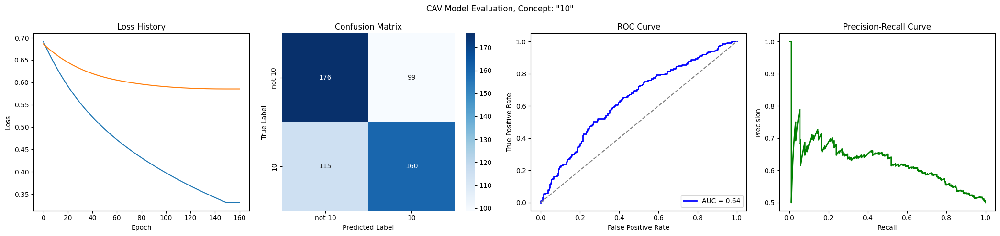

Training run 24/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6481
Epoch 11 Validation Loss: 0.6722
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6039
Epoch 21 Validation Loss: 0.6573
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5655
Epoch 31 Validation Loss: 0.6465
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5318
Epoch 41 Validation Loss: 0.6386
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5021
Epoch 51 Validation Loss: 0.6328
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4755
Epoch 61 Validation Loss: 0.6289
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

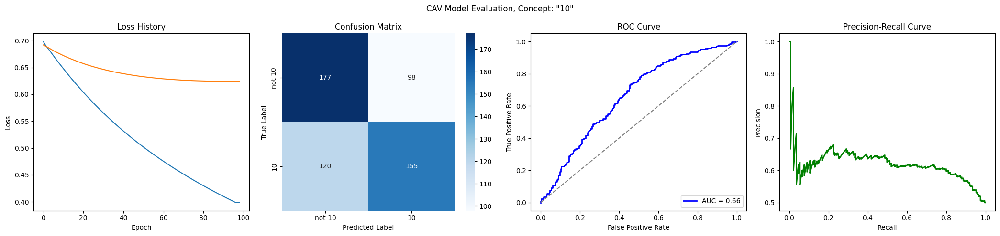

Training run 25/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6892
Epoch 1 Validation Loss: 0.6886
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6388
Epoch 11 Validation Loss: 0.6609
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5945
Epoch 21 Validation Loss: 0.6393
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5559
Epoch 31 Validation Loss: 0.6233
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5219
Epoch 41 Validation Loss: 0.6120
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4918
Epoch 51 Validation Loss: 0.6042
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4648
Epoch 61 Validation Loss: 0.5990
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

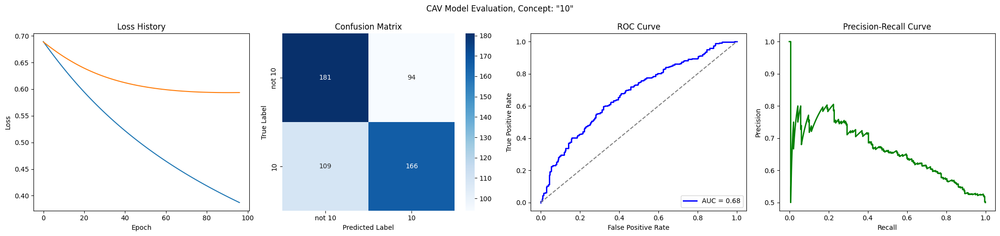

Training run 26/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7046
Epoch 1 Validation Loss: 0.7003
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6553
Epoch 11 Validation Loss: 0.6747
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6180
Epoch 21 Validation Loss: 0.6542
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5838
Epoch 31 Validation Loss: 0.6380
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5528
Epoch 41 Validation Loss: 0.6229
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5245
Epoch 51 Validation Loss: 0.6121
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4986
Epoch 61 Validation Loss: 0.6023
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

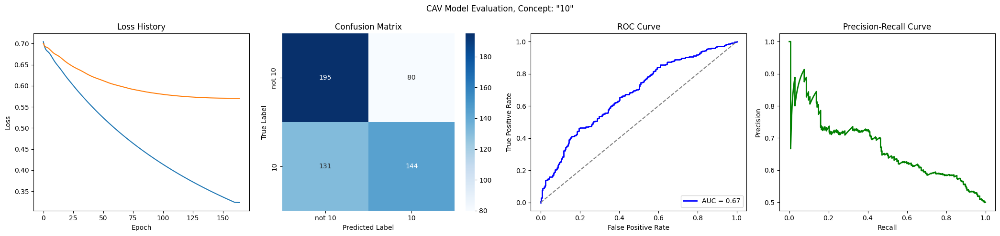

Training run 27/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6423
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5971
Epoch 21 Validation Loss: 0.6628
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5583
Epoch 31 Validation Loss: 0.6566
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5245
Epoch 41 Validation Loss: 0.6527
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4948
Epoch 51 Validation Loss: 0.6507
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4683
Epoch 61 Validation Loss: 0.6506
Early stopping at epoch 64
Loss history saved to trainings/singer_age_decade_10/loss_histor

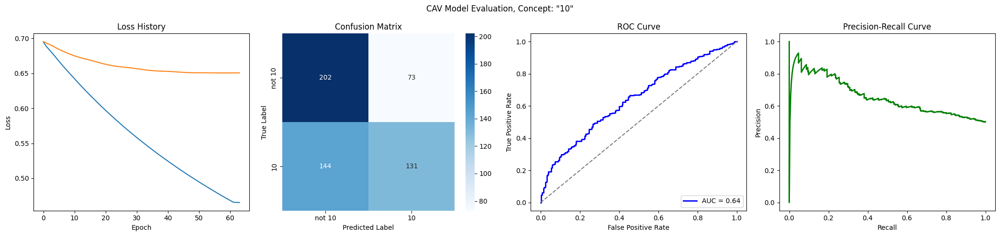

Training run 28/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6427
Epoch 11 Validation Loss: 0.6742
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5958
Epoch 21 Validation Loss: 0.6627
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5553
Epoch 31 Validation Loss: 0.6538
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5200
Epoch 41 Validation Loss: 0.6478
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4891
Epoch 51 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4617
Epoch 61 Validation Loss: 0.6418
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

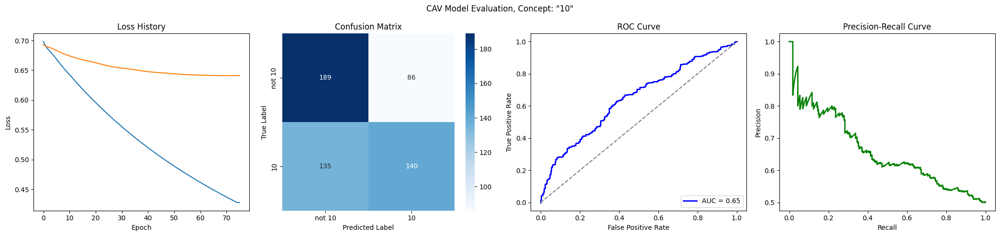

Training run 29/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6493
Epoch 11 Validation Loss: 0.6663
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6087
Epoch 21 Validation Loss: 0.6470
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5728
Epoch 31 Validation Loss: 0.6310
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5410
Epoch 41 Validation Loss: 0.6185
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5127
Epoch 51 Validation Loss: 0.6096
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4872
Epoch 61 Validation Loss: 0.6032
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

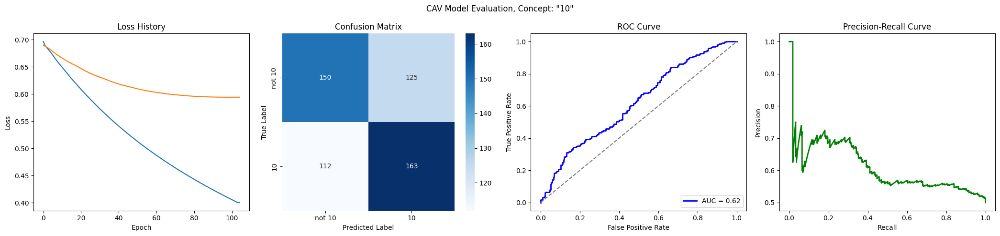

Training run 30/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6674
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5931
Epoch 21 Validation Loss: 0.6508
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5540
Epoch 31 Validation Loss: 0.6380
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5205
Epoch 41 Validation Loss: 0.6277
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4912
Epoch 51 Validation Loss: 0.6196
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4652
Epoch 61 Validation Loss: 0.6138
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

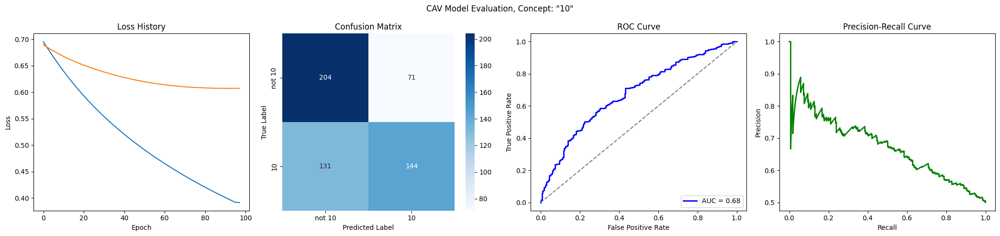

Training run 31/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6388
Epoch 11 Validation Loss: 0.6778
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5922
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5528
Epoch 31 Validation Loss: 0.6647
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5193
Epoch 41 Validation Loss: 0.6620
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4905
Epoch 51 Validation Loss: 0.6609
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 58
Loss history saved to trainings/singer_age_decade_10/loss_history.json


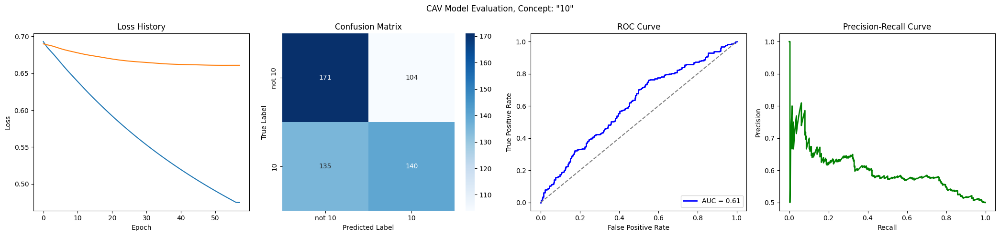

Training run 32/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6367
Epoch 11 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5886
Epoch 21 Validation Loss: 0.6793
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/singer_age_decade_10/loss_history.json


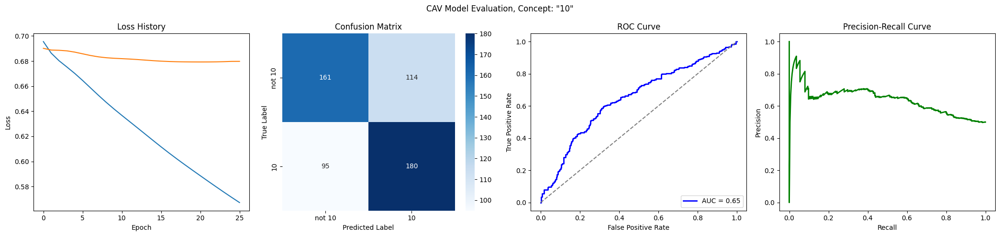

Training run 33/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6446
Epoch 11 Validation Loss: 0.6753
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6018
Epoch 21 Validation Loss: 0.6688
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5644
Epoch 31 Validation Loss: 0.6658
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5315
Epoch 41 Validation Loss: 0.6646
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_10/loss_history.json


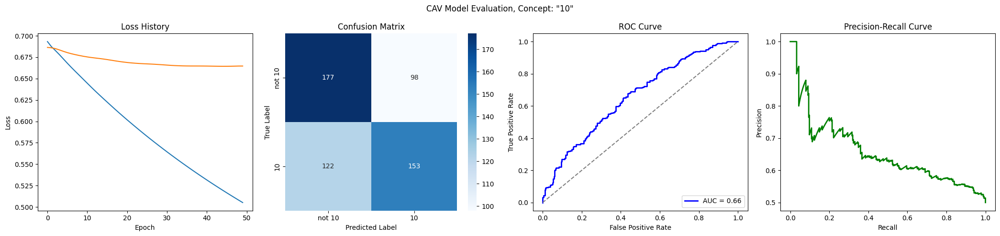

Training run 34/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7015
Epoch 1 Validation Loss: 0.6952
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6445
Epoch 11 Validation Loss: 0.6849
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5974
Epoch 21 Validation Loss: 0.6777
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5634
Epoch 31 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5596
Epoch 41 Validation Loss: 0.6760
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5558
Epoch 51 Validation Loss: 0.6754
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5520
Epoch 61 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

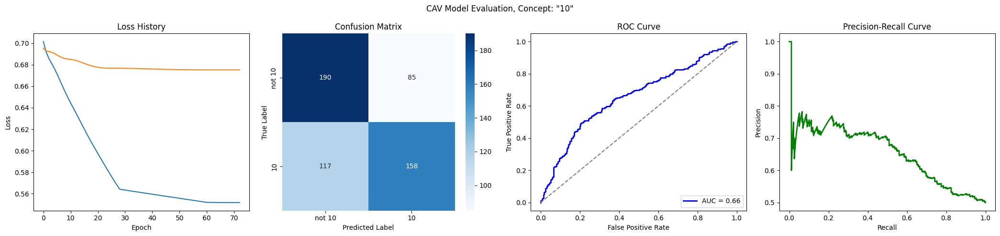

Training run 35/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6464
Epoch 11 Validation Loss: 0.6816
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6028
Epoch 21 Validation Loss: 0.6757
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5640
Epoch 31 Validation Loss: 0.6732
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5297
Epoch 41 Validation Loss: 0.6716
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_10/loss_history.json


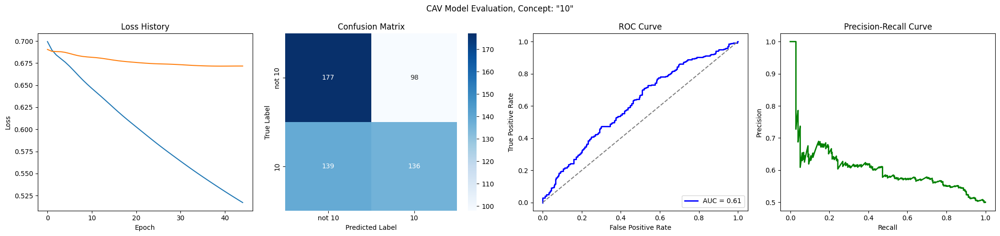

Training run 36/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6375
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5896
Epoch 21 Validation Loss: 0.6727
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5491
Epoch 31 Validation Loss: 0.6701
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5145
Epoch 41 Validation Loss: 0.6688
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4846
Epoch 51 Validation Loss: 0.6686
Early stopping at epoch 53
Loss history saved to trainings/singer_age_decade_10/loss_history.json


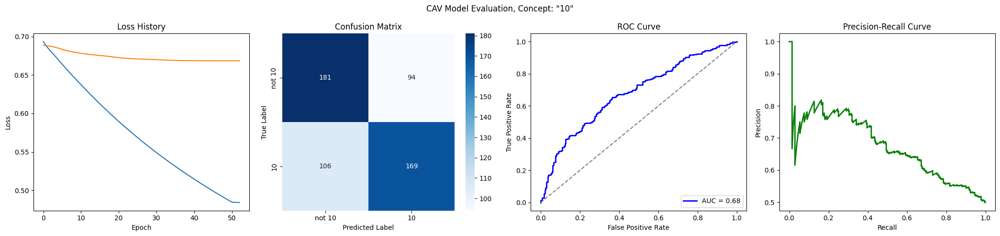

Training run 37/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6450
Epoch 11 Validation Loss: 0.6686
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6035
Epoch 21 Validation Loss: 0.6519
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5691
Epoch 31 Validation Loss: 0.6377
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5395
Epoch 41 Validation Loss: 0.6262
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5133
Epoch 51 Validation Loss: 0.6172
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4899
Epoch 61 Validation Loss: 0.6094
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

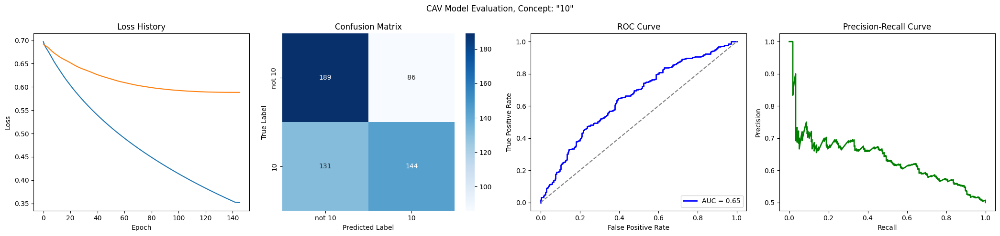

Training run 38/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6878
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6362
Epoch 11 Validation Loss: 0.6655
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5915
Epoch 21 Validation Loss: 0.6464
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5527
Epoch 31 Validation Loss: 0.6328
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5185
Epoch 41 Validation Loss: 0.6235
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4882
Epoch 51 Validation Loss: 0.6176
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4611
Epoch 61 Validation Loss: 0.6143
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

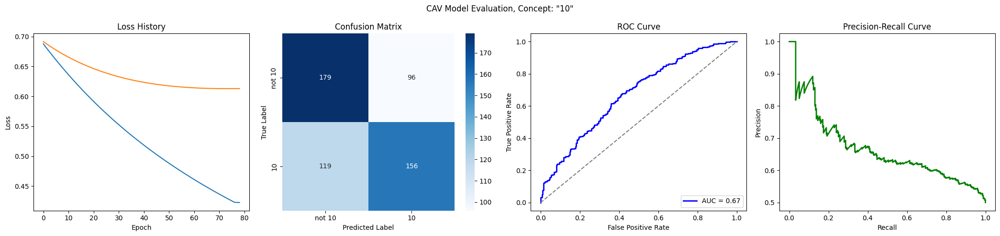

Training run 39/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6938
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6363
Epoch 11 Validation Loss: 0.6767
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5874
Epoch 21 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5464
Epoch 31 Validation Loss: 0.6570
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5120
Epoch 41 Validation Loss: 0.6522
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4825
Epoch 51 Validation Loss: 0.6496
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4568
Epoch 61 Validation Loss: 0.6487
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 67
Los

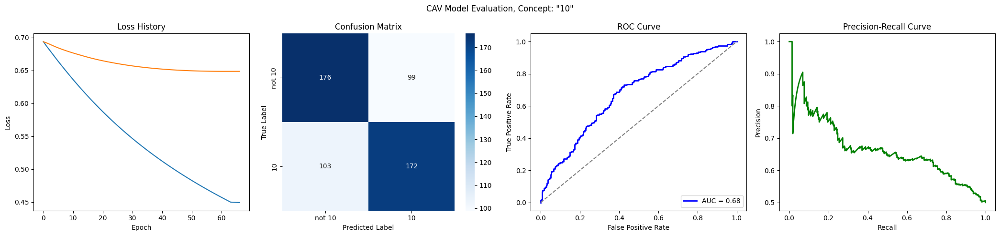

Training run 40/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6343
Epoch 11 Validation Loss: 0.6861
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5822
Epoch 21 Validation Loss: 0.6821
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5388
Epoch 31 Validation Loss: 0.6786
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5021
Epoch 41 Validation Loss: 0.6759
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4706
Epoch 51 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4453
Epoch 61 Validation Loss: 0.6740
Early stopping at epoch 63
Loss history saved to trainings/singer_age_decade_10/loss_histor

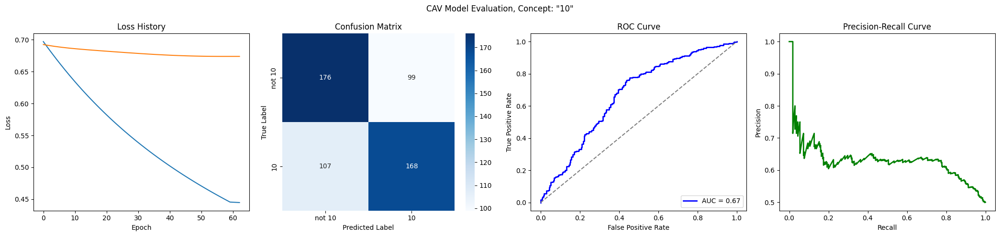

Training run 41/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6379
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5871
Epoch 21 Validation Loss: 0.6704
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5438
Epoch 31 Validation Loss: 0.6654
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5066
Epoch 41 Validation Loss: 0.6634
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4769
Epoch 51 Validation Loss: 0.6634
Early stopping at epoch 51
Loss history saved to trainings/singer_age_decade_10/loss_history.json


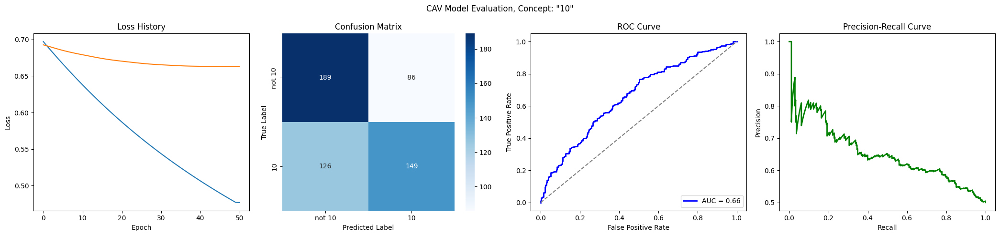

Training run 42/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6908
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6347
Epoch 11 Validation Loss: 0.6723
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5827
Epoch 21 Validation Loss: 0.6587
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5383
Epoch 31 Validation Loss: 0.6492
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5002
Epoch 41 Validation Loss: 0.6434
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4674
Epoch 51 Validation Loss: 0.6403
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4387
Epoch 61 Validation Loss: 0.6393
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 68
Los

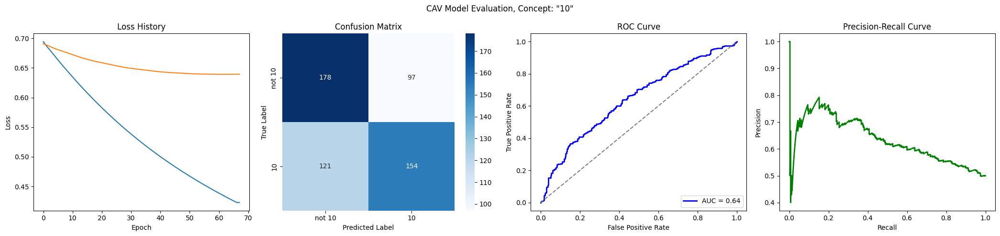

Training run 43/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6358
Epoch 11 Validation Loss: 0.6691
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5897
Epoch 21 Validation Loss: 0.6528
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5523
Epoch 31 Validation Loss: 0.6408
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5204
Epoch 41 Validation Loss: 0.6313
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4924
Epoch 51 Validation Loss: 0.6237
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4675
Epoch 61 Validation Loss: 0.6180
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

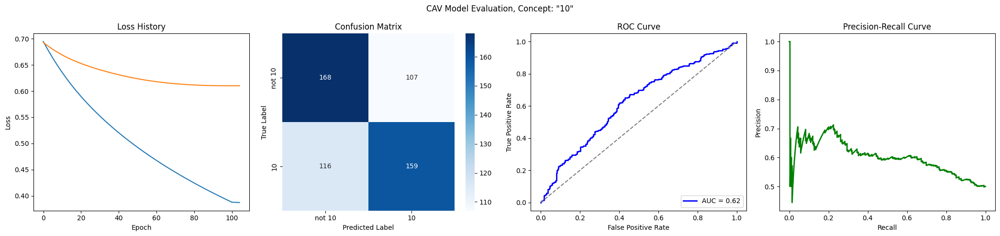

Training run 44/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6841
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6344
Epoch 11 Validation Loss: 0.6740
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5888
Epoch 21 Validation Loss: 0.6679
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5501
Epoch 31 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5165
Epoch 41 Validation Loss: 0.6615
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4868
Epoch 51 Validation Loss: 0.6605
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/singer_age_decade_10/loss_history.json


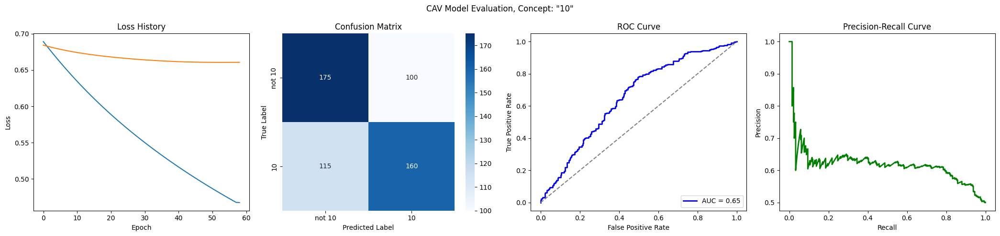

Training run 45/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6973
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6443
Epoch 11 Validation Loss: 0.6821
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6041
Epoch 21 Validation Loss: 0.6716
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5705
Epoch 31 Validation Loss: 0.6677
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5413
Epoch 41 Validation Loss: 0.6650
Early stopping at epoch 45
Loss history saved to trainings/singer_age_decade_10/loss_history.json


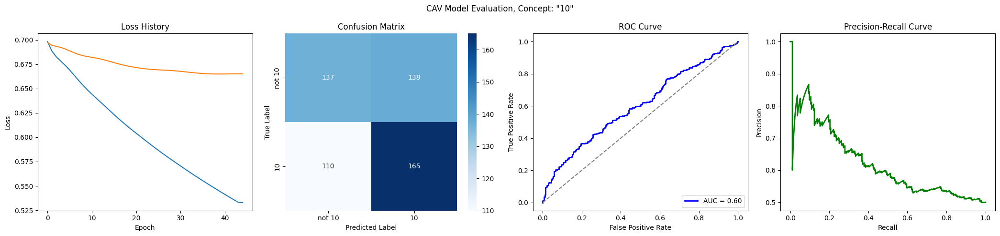

Training run 46/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6437
Epoch 11 Validation Loss: 0.6691
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6007
Epoch 21 Validation Loss: 0.6500
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5635
Epoch 31 Validation Loss: 0.6362
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5307
Epoch 41 Validation Loss: 0.6267
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5018
Epoch 51 Validation Loss: 0.6195
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4760
Epoch 61 Validation Loss: 0.6139
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

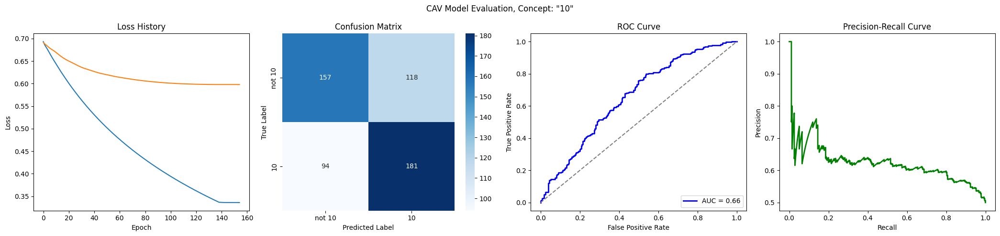

Training run 47/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6403
Epoch 11 Validation Loss: 0.6615
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5977
Epoch 21 Validation Loss: 0.6414
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5615
Epoch 31 Validation Loss: 0.6275
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5302
Epoch 41 Validation Loss: 0.6183
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5025
Epoch 51 Validation Loss: 0.6121
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4777
Epoch 61 Validation Loss: 0.6077
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

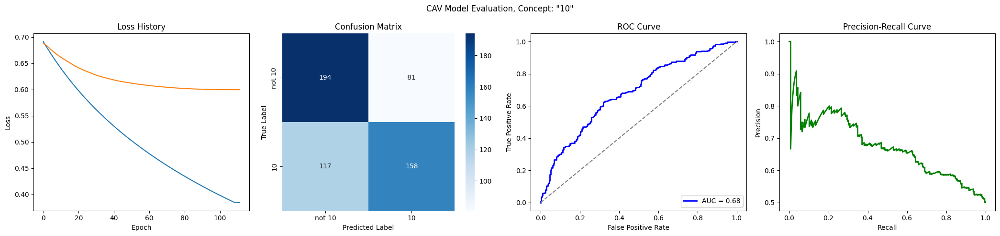

Training run 48/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6874
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6466
Epoch 11 Validation Loss: 0.6702
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6048
Epoch 21 Validation Loss: 0.6579
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5684
Epoch 31 Validation Loss: 0.6499
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5359
Epoch 41 Validation Loss: 0.6449
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5068
Epoch 51 Validation Loss: 0.6423
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4805
Epoch 61 Validation Loss: 0.6415
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 67
Los

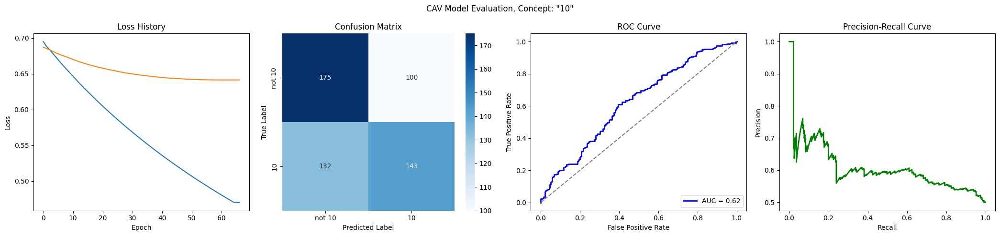

Training run 49/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6914
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6322
Epoch 11 Validation Loss: 0.6776
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5822
Epoch 21 Validation Loss: 0.6691
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5400
Epoch 31 Validation Loss: 0.6639
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5038
Epoch 41 Validation Loss: 0.6599
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4725
Epoch 51 Validation Loss: 0.6566
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4451
Epoch 61 Validation Loss: 0.6543
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

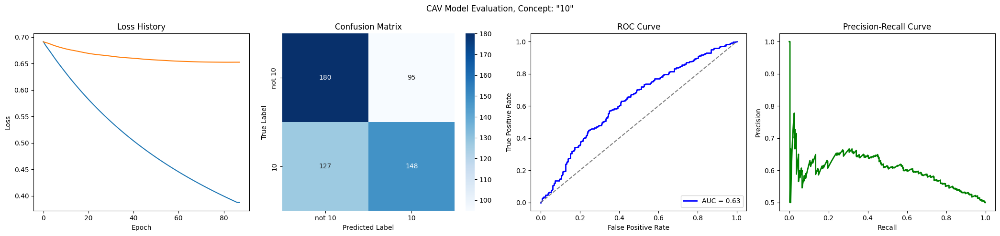

Training run 50/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6428
Epoch 11 Validation Loss: 0.6861
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5975
Epoch 21 Validation Loss: 0.6854
Early stopping at epoch 24
Loss history saved to trainings/singer_age_decade_10/loss_history.json


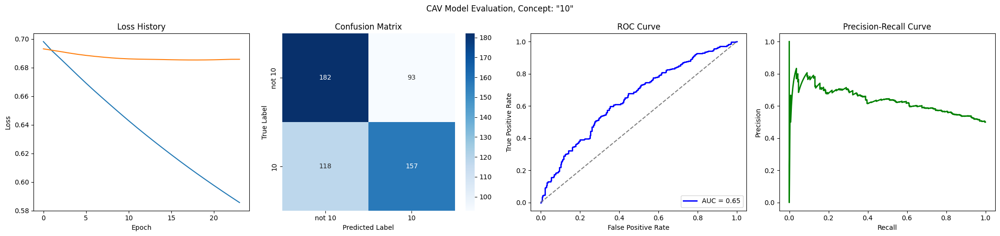

Training run 51/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6321
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5812
Epoch 21 Validation Loss: 0.6661
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5379
Epoch 31 Validation Loss: 0.6568
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5009
Epoch 41 Validation Loss: 0.6504
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4689
Epoch 51 Validation Loss: 0.6463
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4408
Epoch 61 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

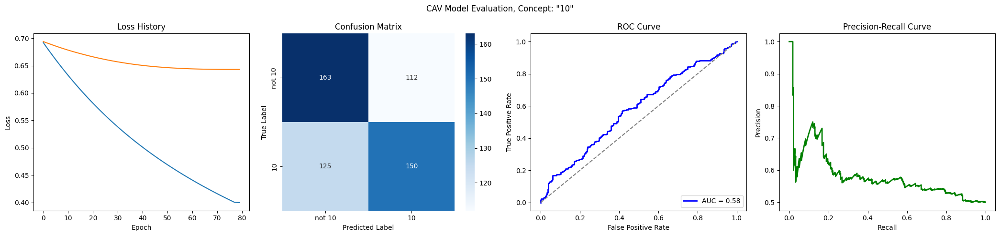

Training run 52/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6849
Epoch 1 Validation Loss: 0.6859
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6243
Epoch 11 Validation Loss: 0.6697
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5730
Epoch 21 Validation Loss: 0.6605
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5297
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4927
Epoch 41 Validation Loss: 0.6533
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4607
Epoch 51 Validation Loss: 0.6526
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 57
Loss history saved to trainings/singer_age_decade_10/loss_history.json


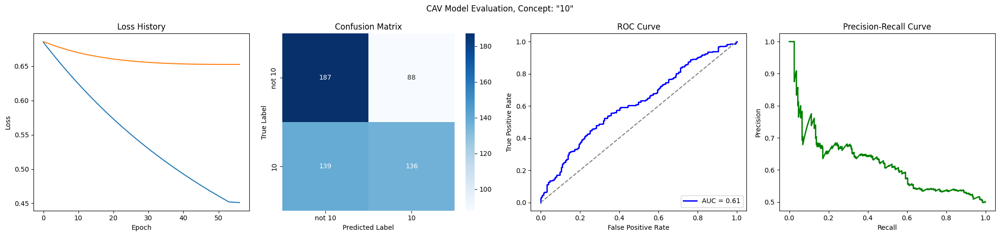

Training run 53/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6314
Epoch 11 Validation Loss: 0.6700
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5770
Epoch 21 Validation Loss: 0.6559
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5315
Epoch 31 Validation Loss: 0.6460
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4934
Epoch 41 Validation Loss: 0.6393
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4609
Epoch 51 Validation Loss: 0.6354
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4328
Epoch 61 Validation Loss: 0.6337
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 70
Los

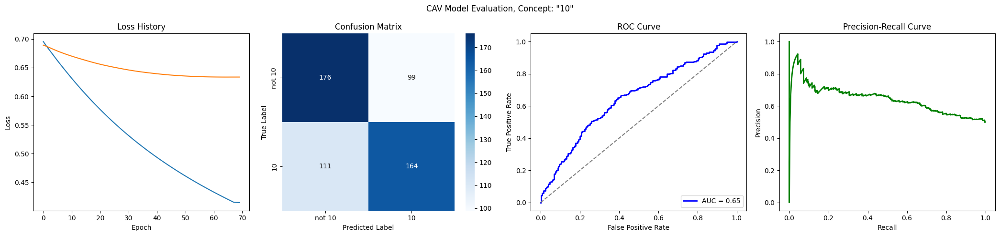

Training run 54/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6399
Epoch 11 Validation Loss: 0.6825
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5932
Epoch 21 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5531
Epoch 31 Validation Loss: 0.6697
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5183
Epoch 41 Validation Loss: 0.6663
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4878
Epoch 51 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/singer_age_decade_10/loss_history.json


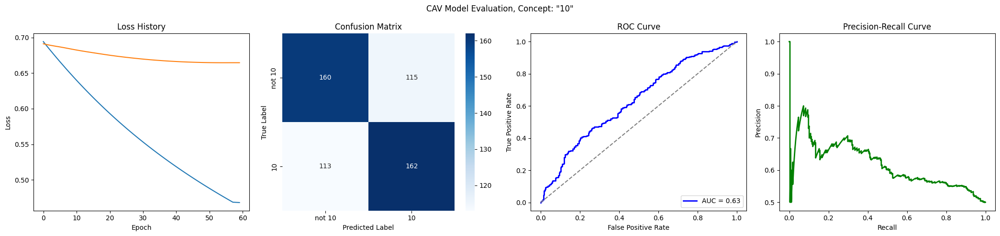

Training run 55/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6544
Epoch 11 Validation Loss: 0.6734
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6141
Epoch 21 Validation Loss: 0.6583
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5781
Epoch 31 Validation Loss: 0.6472
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5459
Epoch 41 Validation Loss: 0.6394
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5169
Epoch 51 Validation Loss: 0.6338
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4906
Epoch 61 Validation Loss: 0.6302
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

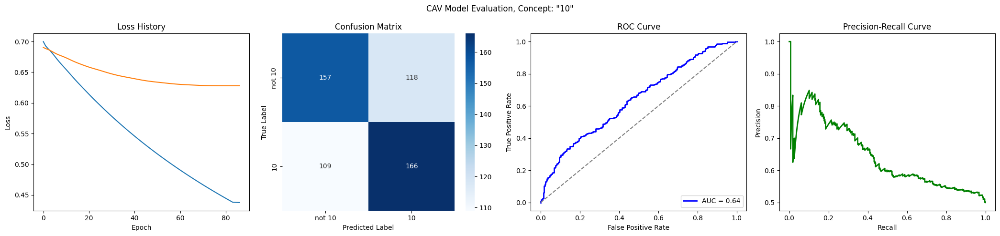

Training run 56/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6460
Epoch 11 Validation Loss: 0.6730
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6058
Epoch 21 Validation Loss: 0.6574
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5704
Epoch 31 Validation Loss: 0.6443
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5392
Epoch 41 Validation Loss: 0.6339
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5113
Epoch 51 Validation Loss: 0.6256
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4862
Epoch 61 Validation Loss: 0.6192
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

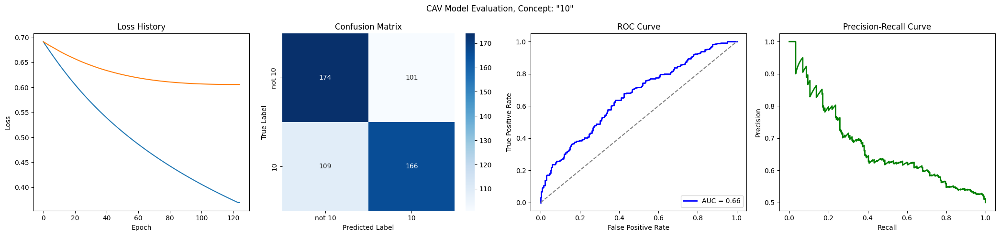

Training run 57/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6860
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6287
Epoch 11 Validation Loss: 0.6720
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5786
Epoch 21 Validation Loss: 0.6562
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5352
Epoch 31 Validation Loss: 0.6431
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4973
Epoch 41 Validation Loss: 0.6324
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4640
Epoch 51 Validation Loss: 0.6241
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4344
Epoch 61 Validation Loss: 0.6176
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

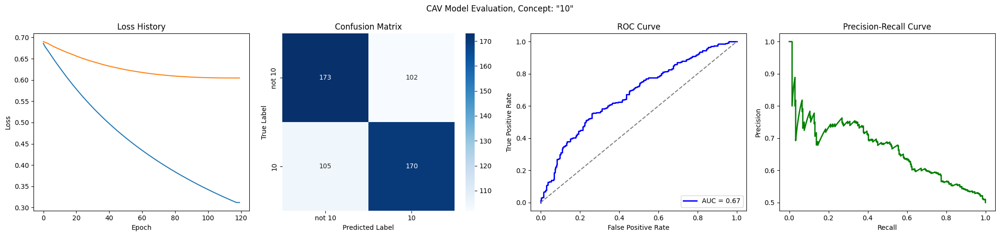

Training run 58/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6873
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6359
Epoch 11 Validation Loss: 0.6680
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5904
Epoch 21 Validation Loss: 0.6493
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5508
Epoch 31 Validation Loss: 0.6357
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5163
Epoch 41 Validation Loss: 0.6263
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4859
Epoch 51 Validation Loss: 0.6200
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4590
Epoch 61 Validation Loss: 0.6159
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

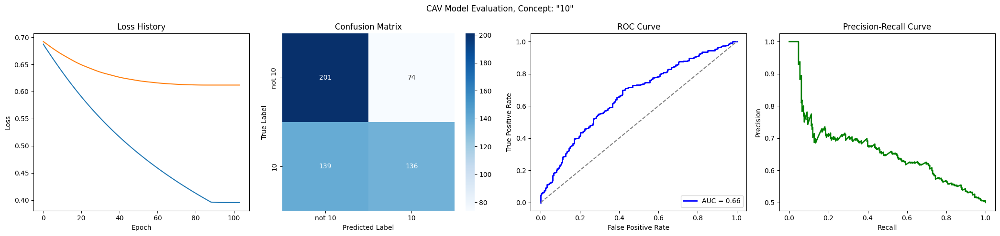

Training run 59/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6420
Epoch 11 Validation Loss: 0.6583
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5965
Epoch 21 Validation Loss: 0.6337
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5577
Epoch 31 Validation Loss: 0.6154
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5244
Epoch 41 Validation Loss: 0.6015
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4953
Epoch 51 Validation Loss: 0.5914
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4694
Epoch 61 Validation Loss: 0.5841
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

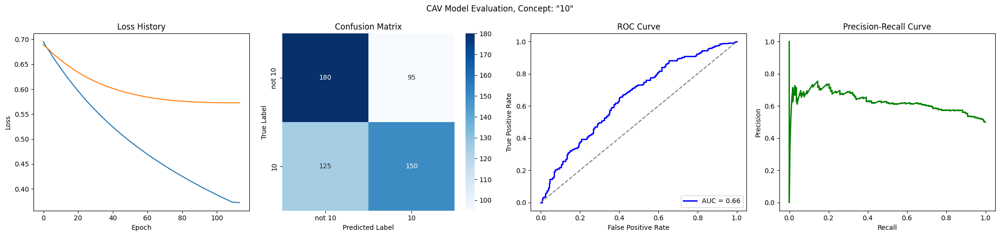

Training run 60/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6350
Epoch 11 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5882
Epoch 21 Validation Loss: 0.6545
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5492
Epoch 31 Validation Loss: 0.6429
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5161
Epoch 41 Validation Loss: 0.6343
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4874
Epoch 51 Validation Loss: 0.6285
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4623
Epoch 61 Validation Loss: 0.6254
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

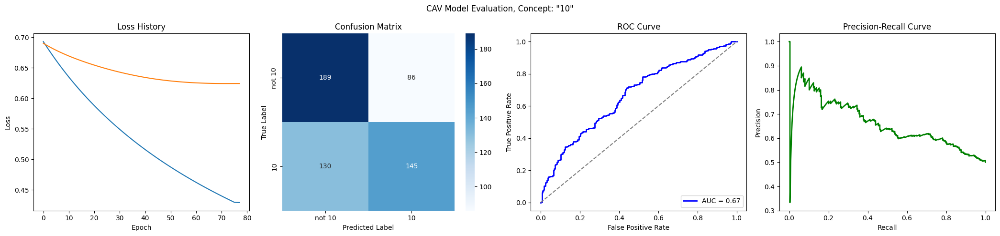

Training run 61/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6909
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6351
Epoch 11 Validation Loss: 0.6728
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5895
Epoch 21 Validation Loss: 0.6612
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5512
Epoch 31 Validation Loss: 0.6537
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5183
Epoch 41 Validation Loss: 0.6488
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4894
Epoch 51 Validation Loss: 0.6455
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4637
Epoch 61 Validation Loss: 0.6436
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

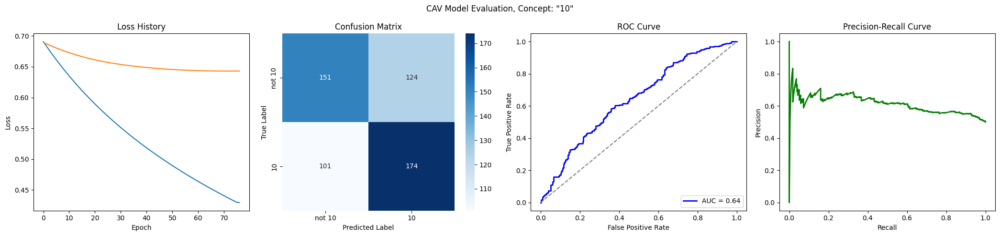

Training run 62/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5997
Epoch 21 Validation Loss: 0.6640
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5606
Epoch 31 Validation Loss: 0.6543
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5269
Epoch 41 Validation Loss: 0.6475
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4974
Epoch 51 Validation Loss: 0.6429
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4713
Epoch 61 Validation Loss: 0.6402
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

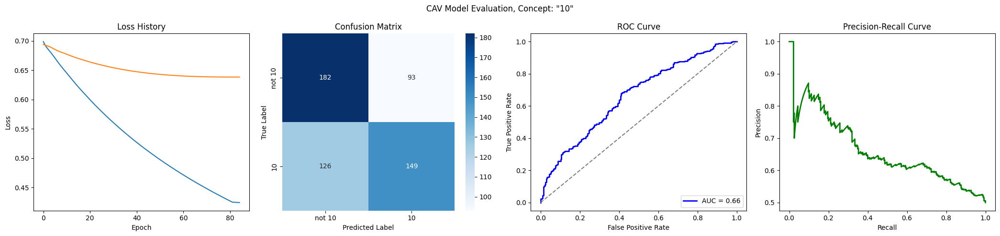

Training run 63/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6482
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6044
Epoch 21 Validation Loss: 0.6656
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5653
Epoch 31 Validation Loss: 0.6570
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5312
Epoch 41 Validation Loss: 0.6507
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5011
Epoch 51 Validation Loss: 0.6462
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4744
Epoch 61 Validation Loss: 0.6433
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

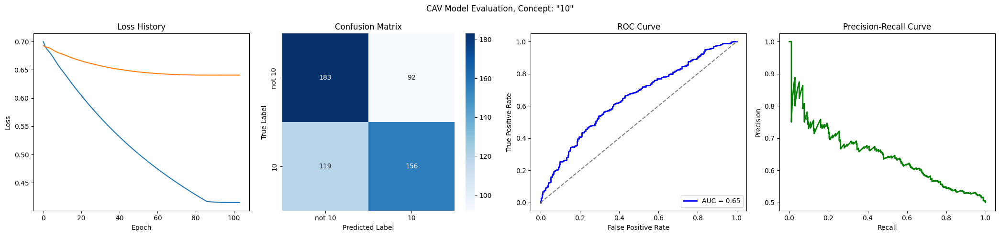

Training run 64/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6441
Epoch 11 Validation Loss: 0.6754
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6016
Epoch 21 Validation Loss: 0.6628
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5655
Epoch 31 Validation Loss: 0.6536
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5343
Epoch 41 Validation Loss: 0.6472
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5071
Epoch 51 Validation Loss: 0.6432
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4828
Epoch 61 Validation Loss: 0.6409
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

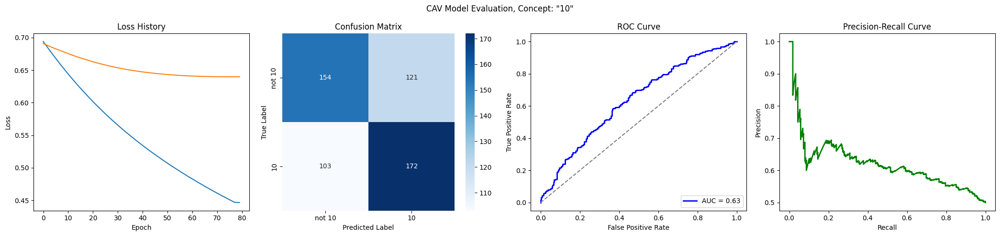

Training run 65/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6883
Epoch 1 Validation Loss: 0.6851
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6334
Epoch 11 Validation Loss: 0.6715
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5854
Epoch 21 Validation Loss: 0.6594
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5439
Epoch 31 Validation Loss: 0.6496
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5079
Epoch 41 Validation Loss: 0.6424
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4766
Epoch 51 Validation Loss: 0.6381
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4491
Epoch 61 Validation Loss: 0.6363
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 70
Los

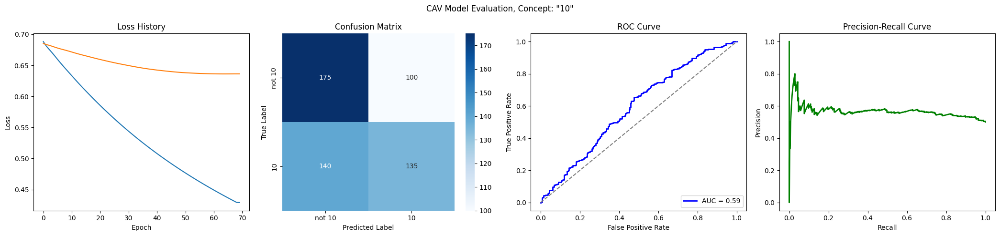

Training run 66/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6823
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6007
Epoch 21 Validation Loss: 0.6751
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5622
Epoch 31 Validation Loss: 0.6714
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5287
Epoch 41 Validation Loss: 0.6699
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_10/loss_history.json


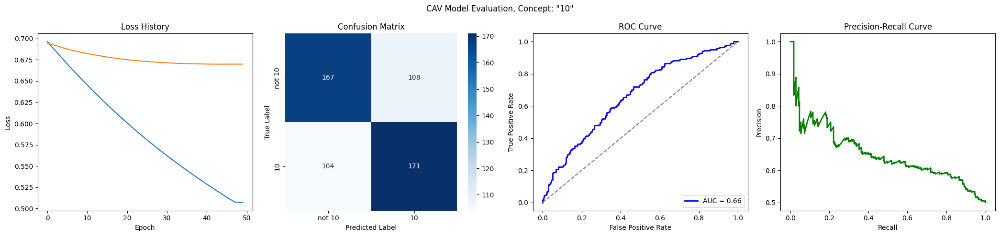

Training run 67/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6347
Epoch 11 Validation Loss: 0.6704
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5846
Epoch 21 Validation Loss: 0.6550
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5423
Epoch 31 Validation Loss: 0.6428
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5062
Epoch 41 Validation Loss: 0.6343
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4750
Epoch 51 Validation Loss: 0.6289
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4476
Epoch 61 Validation Loss: 0.6256
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

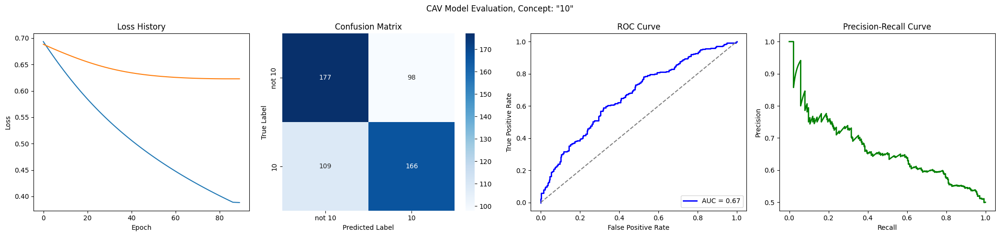

Training run 68/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6468
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6009
Epoch 21 Validation Loss: 0.6736
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5608
Epoch 31 Validation Loss: 0.6676
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5254
Epoch 41 Validation Loss: 0.6633
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4939
Epoch 51 Validation Loss: 0.6607
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4657
Epoch 61 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 68
Los

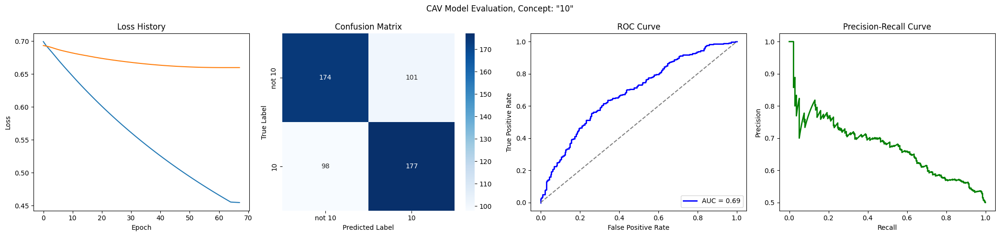

Training run 69/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6356
Epoch 11 Validation Loss: 0.6779
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5864
Epoch 21 Validation Loss: 0.6667
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5449
Epoch 31 Validation Loss: 0.6585
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5098
Epoch 41 Validation Loss: 0.6526
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4796
Epoch 51 Validation Loss: 0.6483
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4532
Epoch 61 Validation Loss: 0.6454
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

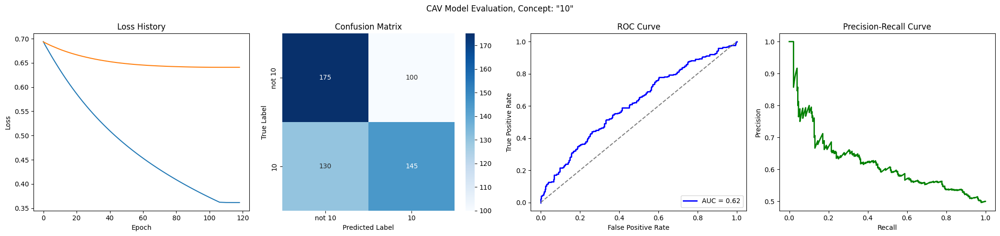

Training run 70/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6904
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6350
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5891
Epoch 21 Validation Loss: 0.6716
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5507
Epoch 31 Validation Loss: 0.6644
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5176
Epoch 41 Validation Loss: 0.6574
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4885
Epoch 51 Validation Loss: 0.6510
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4627
Epoch 61 Validation Loss: 0.6456
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

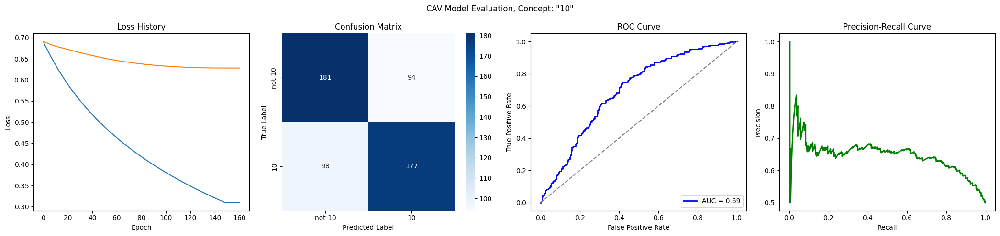

Training run 71/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6376
Epoch 11 Validation Loss: 0.6759
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5901
Epoch 21 Validation Loss: 0.6645
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5507
Epoch 31 Validation Loss: 0.6566
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5174
Epoch 41 Validation Loss: 0.6504
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4889
Epoch 51 Validation Loss: 0.6457
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4639
Epoch 61 Validation Loss: 0.6422
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

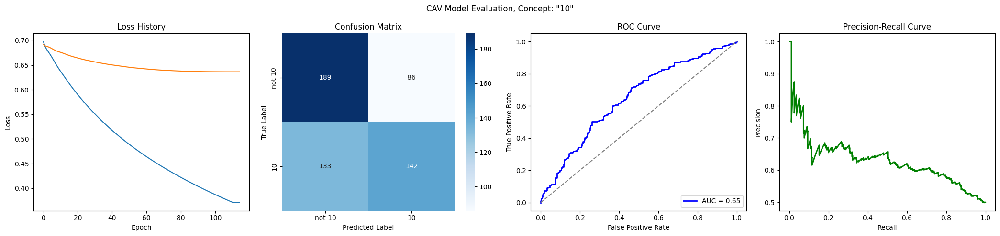

Training run 72/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6408
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5975
Epoch 21 Validation Loss: 0.6677
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5605
Epoch 31 Validation Loss: 0.6591
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5285
Epoch 41 Validation Loss: 0.6533
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5006
Epoch 51 Validation Loss: 0.6496
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4758
Epoch 61 Validation Loss: 0.6475
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

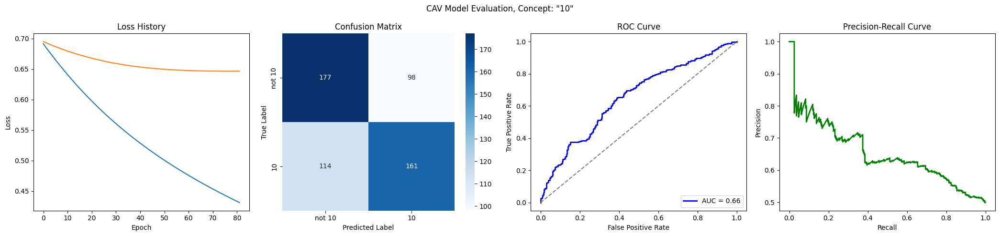

Training run 73/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6430
Epoch 11 Validation Loss: 0.6875
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5975
Epoch 21 Validation Loss: 0.6827
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5579
Epoch 31 Validation Loss: 0.6809
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/singer_age_decade_10/loss_history.json


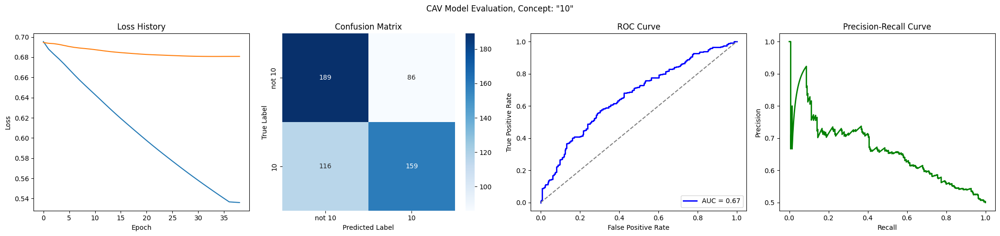

Training run 74/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.7005
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6374
Epoch 11 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5867
Epoch 21 Validation Loss: 0.6881
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5446
Epoch 31 Validation Loss: 0.6866
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5085
Epoch 41 Validation Loss: 0.6859
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_10/loss_history.json


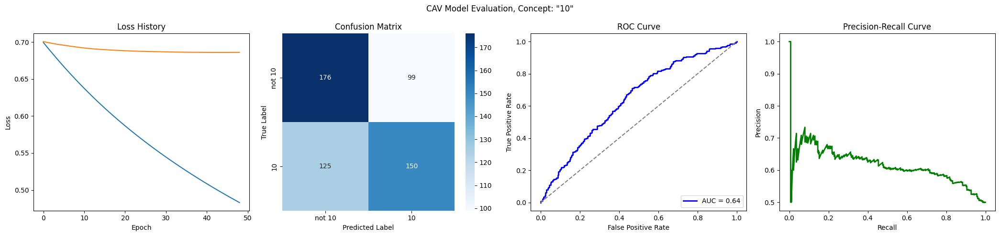

Training run 75/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6903
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6439
Epoch 11 Validation Loss: 0.6664
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6038
Epoch 21 Validation Loss: 0.6454
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5685
Epoch 31 Validation Loss: 0.6308
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5375
Epoch 41 Validation Loss: 0.6206
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5101
Epoch 51 Validation Loss: 0.6130
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4857
Epoch 61 Validation Loss: 0.6079
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

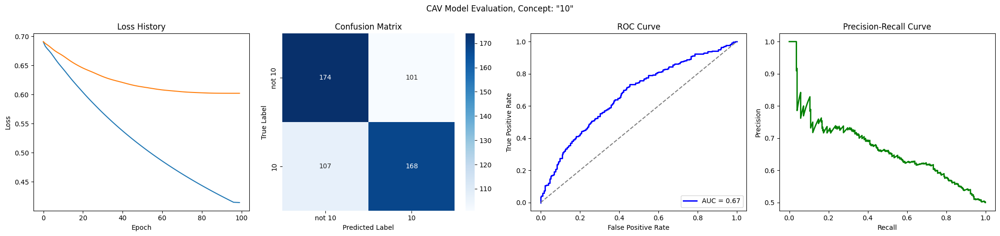

Training run 76/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6961
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6468
Epoch 11 Validation Loss: 0.6775
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6031
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5646
Epoch 31 Validation Loss: 0.6658
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5305
Epoch 41 Validation Loss: 0.6644
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5161
Epoch 51 Validation Loss: 0.6643
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5157
Epoch 61 Validation Loss: 0.6643
Early stopping at epoch 64
Loss history saved to trainings/singer_age_decade_10/loss_histor

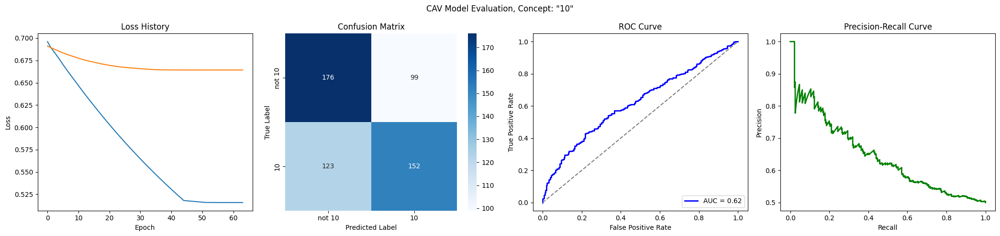

Training run 77/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.7023
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6435
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5955
Epoch 21 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5545
Epoch 31 Validation Loss: 0.6717
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5193
Epoch 41 Validation Loss: 0.6708
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/singer_age_decade_10/loss_history.json


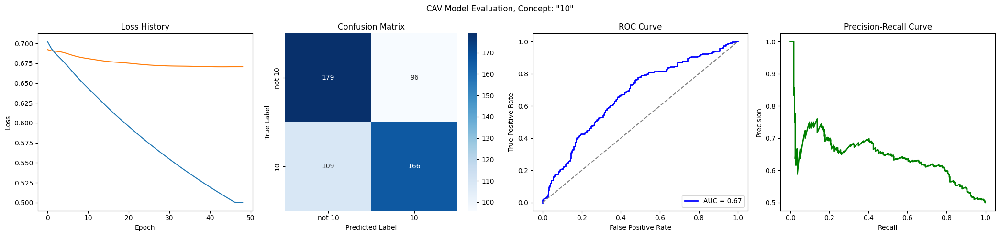

Training run 78/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6355
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5841
Epoch 21 Validation Loss: 0.6671
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5419
Epoch 31 Validation Loss: 0.6622
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5069
Epoch 41 Validation Loss: 0.6590
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4769
Epoch 51 Validation Loss: 0.6561
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4509
Epoch 61 Validation Loss: 0.6539
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

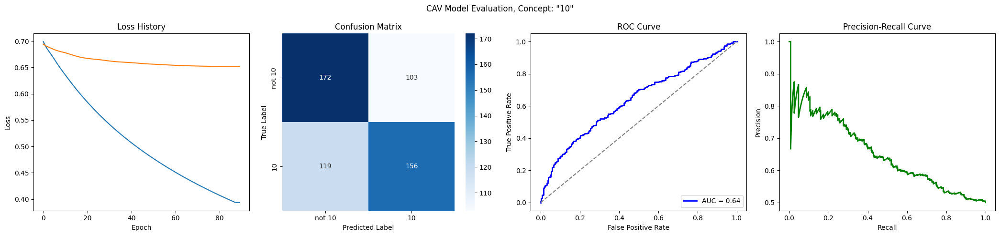

Training run 79/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6384
Epoch 11 Validation Loss: 0.6702
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5910
Epoch 21 Validation Loss: 0.6529
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5500
Epoch 31 Validation Loss: 0.6394
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5143
Epoch 41 Validation Loss: 0.6296
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4828
Epoch 51 Validation Loss: 0.6231
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4548
Epoch 61 Validation Loss: 0.6191
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

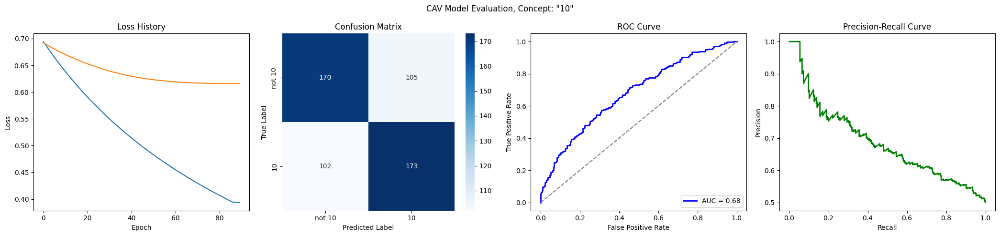

Training run 80/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6443
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6022
Epoch 21 Validation Loss: 0.6707
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5659
Epoch 31 Validation Loss: 0.6627
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5342
Epoch 41 Validation Loss: 0.6567
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5061
Epoch 51 Validation Loss: 0.6526
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4809
Epoch 61 Validation Loss: 0.6502
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

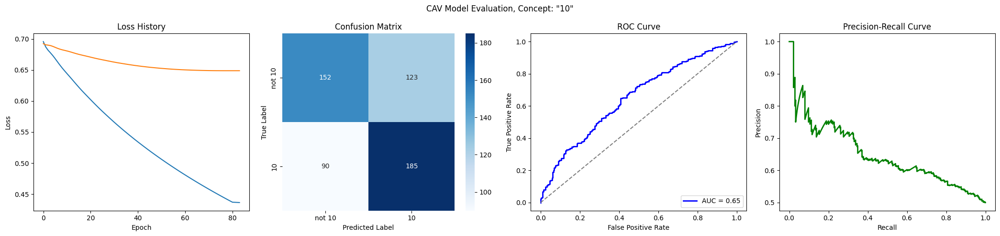

Training run 81/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6497
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6096
Epoch 21 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5751
Epoch 31 Validation Loss: 0.6714
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 40
Loss history saved to trainings/singer_age_decade_10/loss_history.json


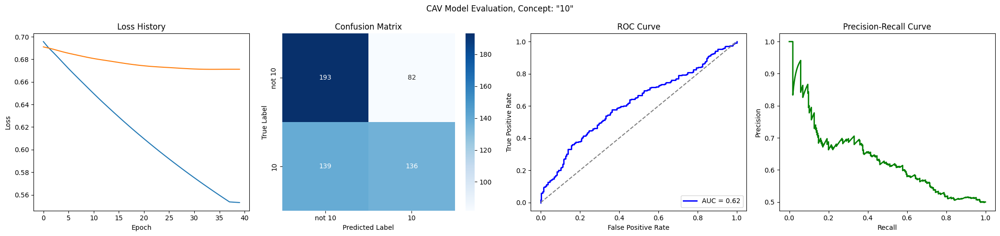

Training run 82/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6415
Epoch 11 Validation Loss: 0.6811
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5966
Epoch 21 Validation Loss: 0.6723
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5585
Epoch 31 Validation Loss: 0.6668
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5258
Epoch 41 Validation Loss: 0.6633
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4973
Epoch 51 Validation Loss: 0.6601
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4719
Epoch 61 Validation Loss: 0.6577
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

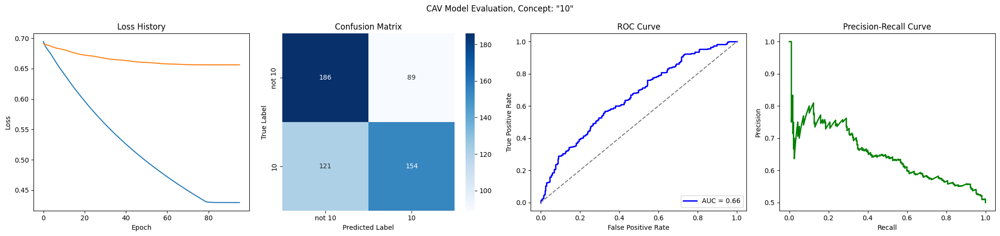

Training run 83/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6873
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6457
Epoch 11 Validation Loss: 0.6664
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6032
Epoch 21 Validation Loss: 0.6531
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5671
Epoch 31 Validation Loss: 0.6451
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5354
Epoch 41 Validation Loss: 0.6404
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5071
Epoch 51 Validation Loss: 0.6374
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4816
Epoch 61 Validation Loss: 0.6356
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

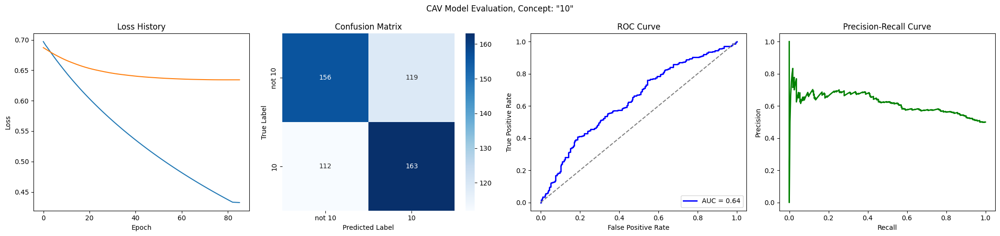

Training run 84/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6456
Epoch 11 Validation Loss: 0.6743
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6055
Epoch 21 Validation Loss: 0.6621
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5699
Epoch 31 Validation Loss: 0.6521
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5385
Epoch 41 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5105
Epoch 51 Validation Loss: 0.6380
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4854
Epoch 61 Validation Loss: 0.6335
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

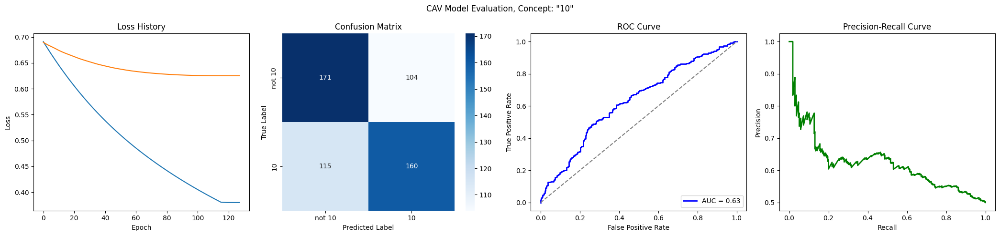

Training run 85/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6875
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6381
Epoch 11 Validation Loss: 0.6763
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5922
Epoch 21 Validation Loss: 0.6721
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5536
Epoch 31 Validation Loss: 0.6707
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5204
Epoch 41 Validation Loss: 0.6698
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4915
Epoch 51 Validation Loss: 0.6689
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4657
Epoch 61 Validation Loss: 0.6683
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 70
Los

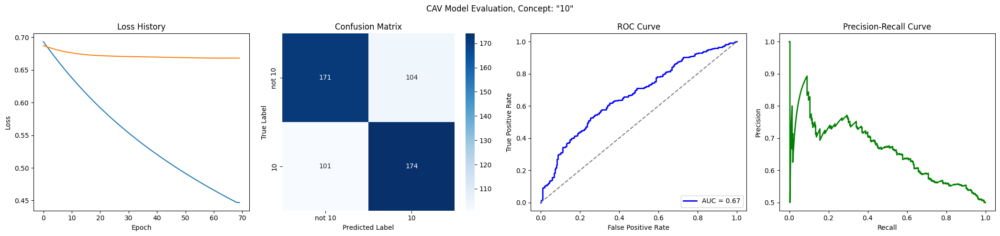

Training run 86/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6383
Epoch 11 Validation Loss: 0.6710
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5927
Epoch 21 Validation Loss: 0.6555
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5537
Epoch 31 Validation Loss: 0.6441
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5198
Epoch 41 Validation Loss: 0.6360
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4900
Epoch 51 Validation Loss: 0.6305
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4635
Epoch 61 Validation Loss: 0.6272
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

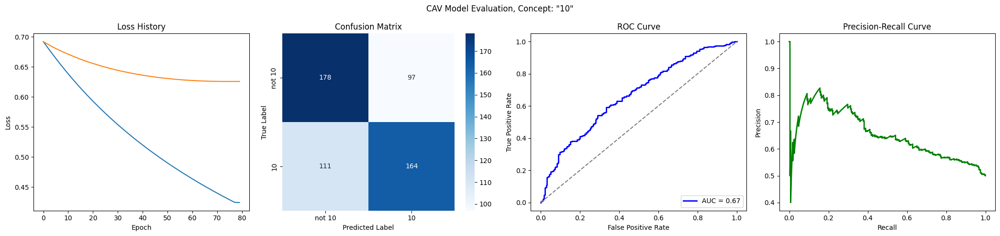

Training run 87/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6915
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6376
Epoch 11 Validation Loss: 0.6695
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5939
Epoch 21 Validation Loss: 0.6554
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5576
Epoch 31 Validation Loss: 0.6453
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5263
Epoch 41 Validation Loss: 0.6374
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4987
Epoch 51 Validation Loss: 0.6315
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4741
Epoch 61 Validation Loss: 0.6271
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

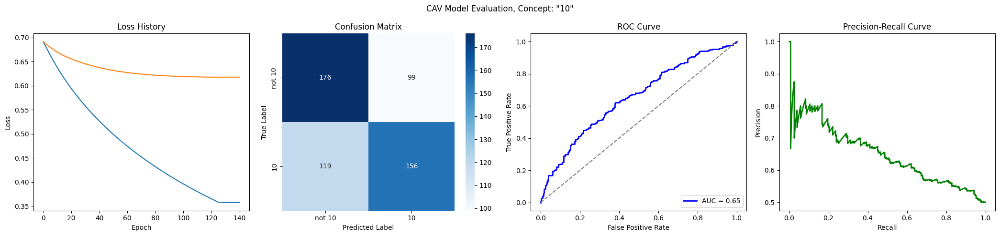

Training run 88/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6946
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6367
Epoch 11 Validation Loss: 0.6572
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5873
Epoch 21 Validation Loss: 0.6306
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5453
Epoch 31 Validation Loss: 0.6112
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5091
Epoch 41 Validation Loss: 0.5974
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4776
Epoch 51 Validation Loss: 0.5877
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4497
Epoch 61 Validation Loss: 0.5809
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

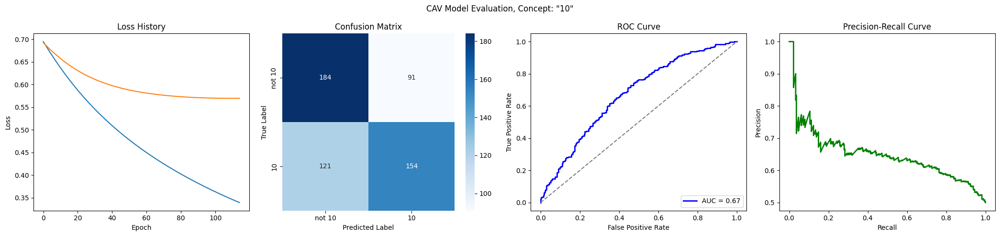

Training run 89/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6434
Epoch 11 Validation Loss: 0.6728
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5999
Epoch 21 Validation Loss: 0.6588
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5643
Epoch 31 Validation Loss: 0.6489
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5337
Epoch 41 Validation Loss: 0.6411
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5066
Epoch 51 Validation Loss: 0.6346
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4822
Epoch 61 Validation Loss: 0.6295
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

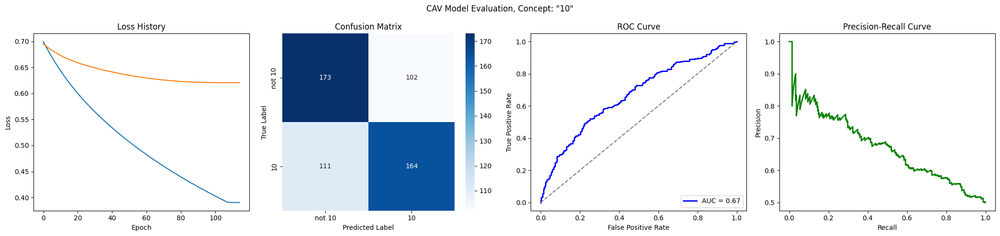

Training run 90/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6421
Epoch 11 Validation Loss: 0.6746
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5935
Epoch 21 Validation Loss: 0.6618
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5500
Epoch 31 Validation Loss: 0.6539
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5115
Epoch 41 Validation Loss: 0.6474
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4774
Epoch 51 Validation Loss: 0.6433
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4471
Epoch 61 Validation Loss: 0.6407
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

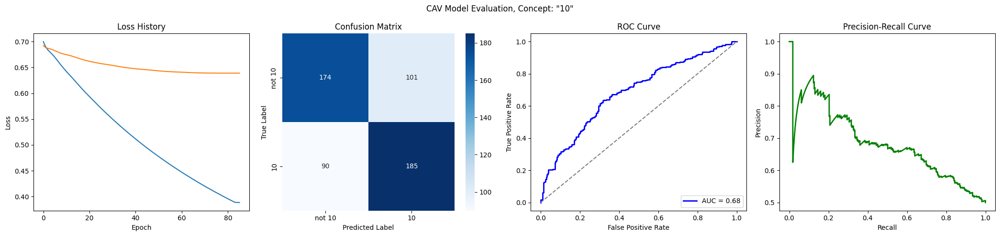

Training run 91/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6429
Epoch 11 Validation Loss: 0.6780
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5964
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5570
Epoch 31 Validation Loss: 0.6633
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5234
Epoch 41 Validation Loss: 0.6602
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4941
Epoch 51 Validation Loss: 0.6579
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4683
Epoch 61 Validation Loss: 0.6570
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 66
Los

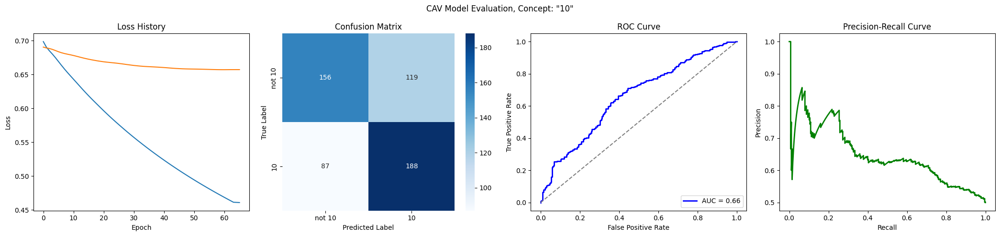

Training run 92/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6450
Epoch 11 Validation Loss: 0.6734
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6038
Epoch 21 Validation Loss: 0.6591
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5681
Epoch 31 Validation Loss: 0.6476
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5366
Epoch 41 Validation Loss: 0.6383
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5087
Epoch 51 Validation Loss: 0.6304
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4837
Epoch 61 Validation Loss: 0.6238
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

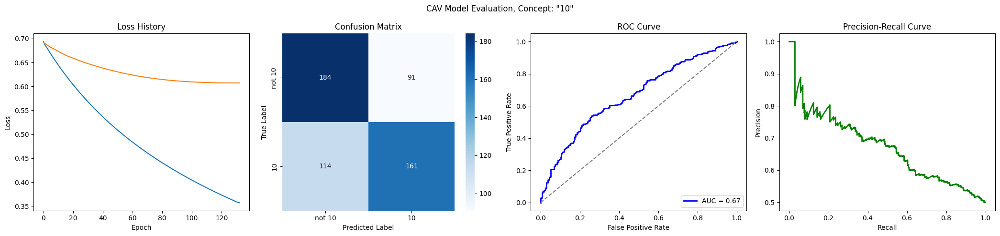

Training run 93/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6991
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6340
Epoch 11 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5869
Epoch 21 Validation Loss: 0.6832
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5483
Epoch 31 Validation Loss: 0.6796
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5153
Epoch 41 Validation Loss: 0.6751
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4864
Epoch 51 Validation Loss: 0.6705
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4608
Epoch 61 Validation Loss: 0.6669
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

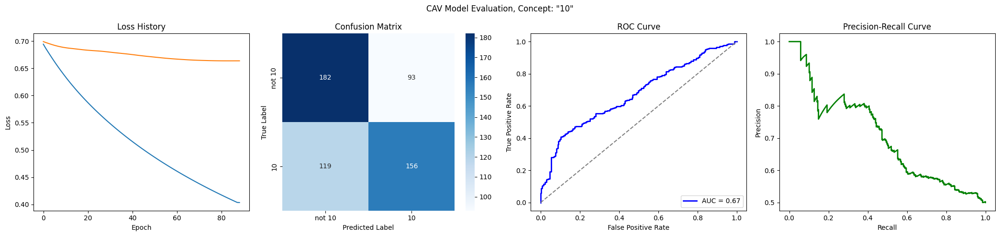

Training run 94/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6390
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5955
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/singer_age_decade_10/state_dict.pth
Early stopping at epoch 28
Loss history saved to trainings/singer_age_decade_10/loss_history.json


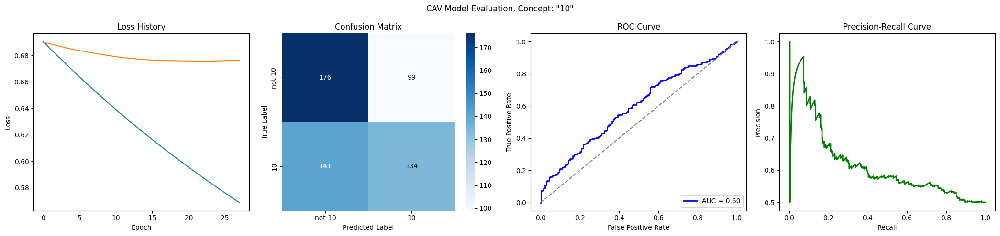

Training run 95/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6431
Epoch 11 Validation Loss: 0.6650
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5985
Epoch 21 Validation Loss: 0.6479
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5606
Epoch 31 Validation Loss: 0.6369
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5275
Epoch 41 Validation Loss: 0.6297
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4981
Epoch 51 Validation Loss: 0.6252
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4719
Epoch 61 Validation Loss: 0.6227
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

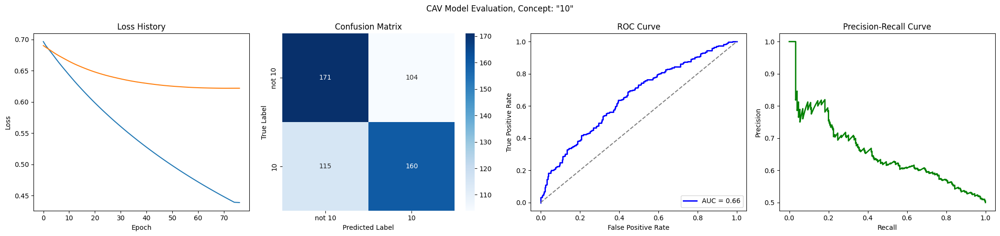

Training run 96/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6908
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6427
Epoch 11 Validation Loss: 0.6773
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6002
Epoch 21 Validation Loss: 0.6673
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5639
Epoch 31 Validation Loss: 0.6593
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5327
Epoch 41 Validation Loss: 0.6526
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5052
Epoch 51 Validation Loss: 0.6471
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4807
Epoch 61 Validation Loss: 0.6428
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

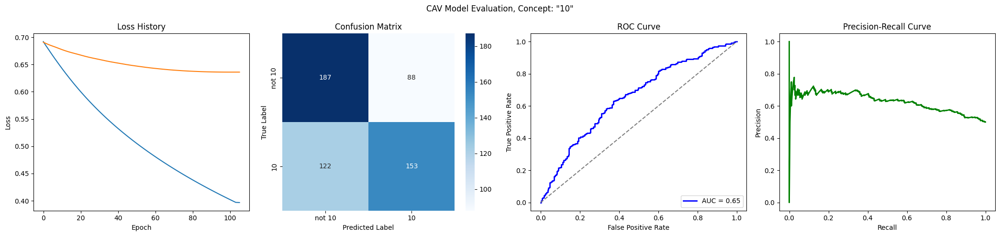

Training run 97/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6970
Epoch 1 Validation Loss: 0.6924
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6673
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5917
Epoch 21 Validation Loss: 0.6513
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5511
Epoch 31 Validation Loss: 0.6415
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5169
Epoch 41 Validation Loss: 0.6360
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4877
Epoch 51 Validation Loss: 0.6335
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4624
Epoch 61 Validation Loss: 0.6333
Early stopping at epoch 64
Loss history saved to trainings/singer_age_decade_10/loss_histor

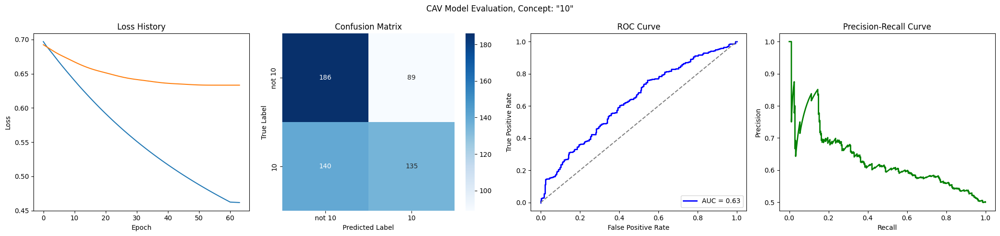

Training run 98/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6864
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6444
Epoch 11 Validation Loss: 0.6851
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_10/loss_history.json


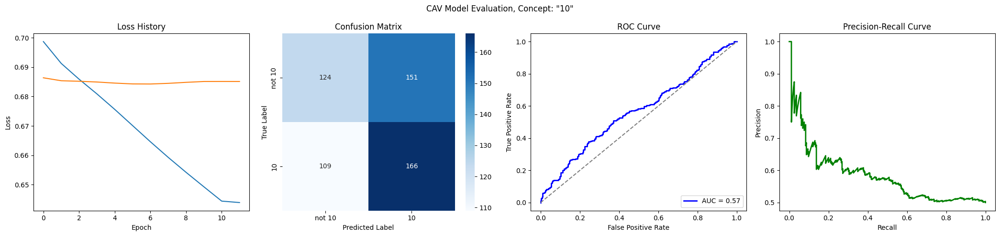

Training run 99/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6387
Epoch 11 Validation Loss: 0.6746
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5884
Epoch 21 Validation Loss: 0.6608
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5457
Epoch 31 Validation Loss: 0.6508
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5087
Epoch 41 Validation Loss: 0.6436
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4764
Epoch 51 Validation Loss: 0.6386
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4479
Epoch 61 Validation Loss: 0.6354
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 71/500
Epoch 71 Train Lo

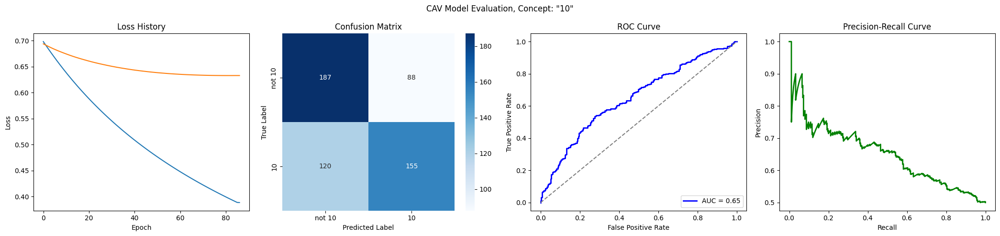

Training run 100/100
100 100
Epoch 1/500
Epoch 1 Train Loss: 0.6988
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6501
Epoch 11 Validation Loss: 0.6776
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6082
Epoch 21 Validation Loss: 0.6677
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5718
Epoch 31 Validation Loss: 0.6622
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5396
Epoch 41 Validation Loss: 0.6597
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5108
Epoch 51 Validation Loss: 0.6592
Early stopping at epoch 54
Loss history saved to trainings/singer_age_decade_10/loss_history.json


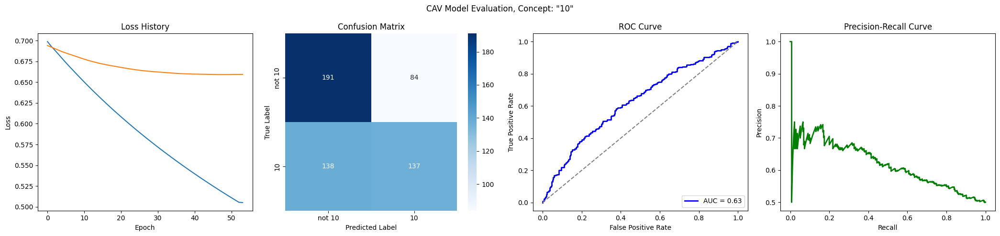

CPU times: user 11min 48s, sys: 6min 47s, total: 18min 36s
Wall time: 1h 14min 23s


In [7]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [8]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [9]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [10]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [11]:
validation_sample_count

30

In [12]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


266 30
Epoch 1/500
Epoch 1 Train Loss: 0.6946
Epoch 1 Validation Loss: 0.6850
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5880
Epoch 11 Validation Loss: 0.6427
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5187
Epoch 21 Validation Loss: 0.6260
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.4713
Epoch 31 Validation Loss: 0.6207
Model saved to trainings/singer_age_decade_10/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4408
Epoch 41 Validation Loss: 0.6201
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_10/loss_history.json


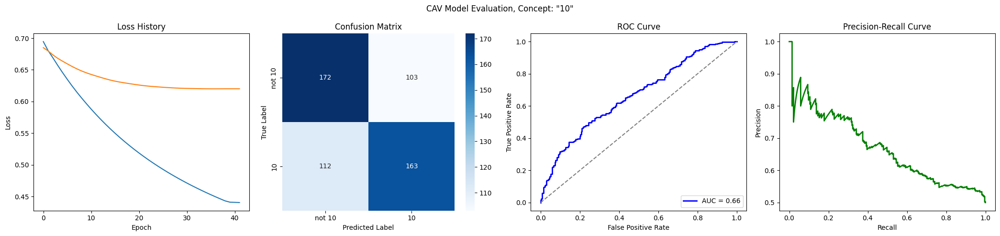

In [13]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
